# Object Detection and Car Counting from Drone-based Parking Lot Images

**Name:** Emirhan Utku  
**Student ID:** 2210765029
**School:** Hacettepe University - Department of Artificial Intelligence Engineering  
**Course:** BBM 418 - Computer Vision Laboratory  
**Instructor:** Dr. Nazlı İkizler Cinbis  
**Semester:** Spring 2024–2025  

---

## Project Overview

In this project, we use the YOLOv8 object detection model to detect and count cars in drone-captured parking lot images. The main objectives include dataset preparation, model training under different layer freezing strategies, hyperparameter experimentation, and performance evaluation in terms of exact match accuracy and mean squared error.

We also provide visualizations of the results and discuss the effectiveness of different training approaches.

---

# Step 1: Dataset Preparation

The provided dataset contains parking lot images taken from drones, along with annotations specifying the bounding boxes of cars. The annotations were initially provided in the format: `<xmin> <ymin> <xmax> <ymax> <class_id>`.

To make the dataset compatible with the YOLOv8 model, we converted all annotation files to the required YOLO format:


In [1]:
import sys
!{sys.executable} -m pip install -q ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 23.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 124.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 97.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 52.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 40.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 17.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 110.2 MB/s eta 0:00:00


In [2]:
from pathlib import Path
import shutil
import random
import yaml


import cv2
import numpy as np
from PIL import Image


import torch
from ultralytics import YOLO
from ultralytics.utils.plotting import plot_results

from google.colab import drive
from IPython.display import Image, display


import pandas as pd
import matplotlib.pyplot as plt


drive.mount('/content/drive')

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Mounted at /content/drive


In [3]:
ds          = Path('/content/drive/MyDrive/cars_dataset')
images_src  = ds / 'Images'       
images_dir  = ds / 'images'       # our new lowercase folder
ann_dir     = ds / 'Annotations'
splits_dir  = ds / 'ImageSets'
labels_dir  = ds / 'labels'

In [4]:
if not images_dir.exists():
    images_dir.mkdir()
    print(f"Created folder {images_dir}")
else:
    print(f"ℹ Folder {images_dir} already exists")

ℹ Folder /content/drive/MyDrive/cars_dataset/images already exists


### 1) Make label directories

In [ ]:
for split in ('train', 'val', 'test'):
    (labels_dir / split).mkdir(parents=True, exist_ok=True)

def convert_and_save(img_id: str, split: str):
    src_ann = ann_dir / f"{img_id}.txt"
    dst_ann = labels_dir / split / f"{img_id}.txt"
    # get original image size
    w, h = Image.open(images_src / f"{img_id}.png").size
    lines = []
    with open(src_ann) as f:
        for row in f:
            xmin, ymin, xmax, ymax, cls = row.split()
            xmin, ymin, xmax, ymax = map(float, (xmin, ymin, xmax, ymax))
            x_c = ((xmin + xmax) / 2) / w
            y_c = ((ymin + ymax) / 2) / h
            bw  = (xmax - xmin) / w
            bh  = (ymax - ymin) / h
            cls_idx = int(cls) - 1
            lines.append(f"{cls_idx} {x_c:.6f} {y_c:.6f} {bw:.6f} {bh:.6f}")
    dst_ann.write_text("\n".join(lines))

**In the first step of the implementation, the annotation files provided in the dataset are converted into the format required by YOLOv8. YOLO expects labels to be in a specific format where each line represents a bounding box using normalized values: the class index followed by the x and y coordinates of the box center, and then the width and height of the box, all normalized by the image’s width and height.**

**To begin, directories are created for storing label files corresponding to the training, validation, and test sets. This ensures that each subset of the dataset has a dedicated location for its annotation files, matching the expected structure of the YOLO training pipeline. The `convert_and_save` function handles the conversion of annotation formats. For each image, it reads the corresponding annotation file containing the top-left and bottom-right coordinates of bounding boxes (in the format `xmin ymin xmax ymax class`). It then calculates the center coordinates and the width and height of each bounding box. These values are normalized by dividing by the original image dimensions so that they fall between 0 and 1, as required by YOLO. Additionally, class indices are shifted from 1-based to 0-based indexing to comply with YOLO’s format.**

**Once the conversion is complete, the new annotation lines are written into `.txt` files inside their respective folders. As a result of this step, all bounding box annotations are now formatted appropriately and stored in a structure that allows YOLOv8 to use them directly for training and evaluation.**


### 2) Build image-list text files and convert labels

In [ ]:
for split in ('train', 'val', 'test'):

    out_list = ds / f"{split}.txt"
    with open(splits_dir / f"{split}.txt") as fin, open(out_list, 'w') as fout:
        for line in fin:
            img_id = line.strip()
            if not img_id:
                continue
            convert_and_save(img_id, split)
            img_path = images_src / f"{img_id}.png"
            fout.write(str(img_path.resolve()) + "\n")
    # copy images into images/{split}/
    dst_split = images_dir / split
    dst_split.mkdir(exist_ok=True)
    for img_path in open(out_list):
        src = Path(img_path.strip())
        shutil.copy(src, dst_split / src.name)

print("Dataset splits created, labels converted, images copied")

Dataset splits created, labels converted, images copied


**In this step, we finalize the dataset preparation process by applying the annotation conversion to all images and organizing the dataset into a format compatible with YOLOv8. For each of the three dataset splits—training, validation, and testing—the corresponding split file (e.g., `train.txt`) is read from the `ImageSets` directory. These files contain lists of image identifiers (without file extensions) that belong to each subset.**

**For every image identifier listed, the `convert_and_save` function is invoked to generate the corresponding annotation in YOLO format. Simultaneously, the absolute path to each image file is written to a new split file (e.g., `train.txt`) at the root of the YOLO dataset directory. This new file serves as an image list file that YOLO uses during training and evaluation.**

**To further prepare the dataset, the actual image files are organized by copying them into dedicated subfolders under `images/`, with separate directories for `train`, `val`, and `test`. These directories are created if they do not already exist. Each image referenced in the image list file is copied from the original `Images/` folder into its corresponding split folder.**

**By the end of this step, the dataset is fully structured according to YOLOv8 requirements: annotations are formatted correctly and stored under `labels/`, image paths are listed in new split files, and images themselves are organized under `images/` by subset. A message is printed to confirm that the splits, labels, and images have been successfully prepared.**


### 3) Write data.yaml for YOLOv8

In [5]:
data = {
    'train': str(ds / 'images/train'),
    'val':   str(ds / 'images/val'),
    'test':  str(ds / 'images/test'),
    'nc':    1,
    'names': ['car']
}

with open(ds / 'data.yaml', 'w') as f:
    yaml.dump(data, f, sort_keys=False)

print("data.yaml written")

data.yaml written


**This step creates the `data.yaml` file, which YOLOv8 uses to locate image folders and define class information. The dictionary includes paths to the training, validation, and test image directories, along with the number of classes (`nc = 1`) and the class name (`'car'`). This file is saved in YAML format at the dataset root. It is essential for YOLOv8 to correctly load the dataset and associate detected objects with their class labels during training and evaluation.**


# Step 2 : Model Training

## Freeze the first 3 blocks

###  Device Selection

In [6]:
if torch.cuda.is_available():
    device = 'cuda'  # CUDA GPU
else:
    device = 'cpu'

print(f" Using device: {device}")

 Using device: cuda


In [7]:
data_yaml = '/content/drive/MyDrive/cars_dataset/data.yaml'
epochs    = 30
imgsz     = 640

In [8]:
freeze_settings = {
    'freeze5':  5,
    'freeze10': 10,
    'freeze21': 21,
    'no_freeze': None
}

In [9]:
hyperparams = [
    {'name':'SGD_lr0.01_bs16', 'optimizer':'SGD',  'lr0':0.01,  'batch':16},
    {'name':'Adam_lr0.001_bs32','optimizer':'Adam', 'lr0':0.001, 'batch':32}
]
results = {}

### ─────────────────Training loop ────────────────────────


In [10]:

for fs_name, fs_value in freeze_settings.items():
    for hp in hyperparams:
        exp_name = f"{fs_name}_{hp['name']}"
        print(f"\n Training {exp_name} …")
        model = YOLO('yolov8n.pt')
        res = model.train(
            data=data_yaml,
            epochs=epochs,
            imgsz=imgsz,
            batch=hp['batch'],
            optimizer=hp['optimizer'],
            lr0=hp['lr0'],
            freeze=fs_value,
            name=exp_name,
            project='runs/train',
            exist_ok=True
        )
        results[exp_name] = res


 Training freeze5_SGD_lr0.01_bs16 …


100%|██████████| 6.25M/6.25M [00:00<00:00, 121MB/s]


Ultralytics 8.3.140 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/cars_dataset/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=5, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=freeze5_SGD_lr0.01_bs16, nbs=64, nms=False, opset=None, optimize=False, optimizer=SGD, overlap_mask=True, patience=100, perspective=0.0, pl

100%|██████████| 755k/755k [00:00<00:00, 19.3MB/s]

Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

Model summary: 129 layers, 3,011,043 parameters, 3,011,027 gradients, 8.2 GFLOPs

Transferred 319/355 items from pretrained weights
Freezing layer 'model.0.conv.weight'
Freezing layer 'model.0.bn.weight'
Freezing layer 'model.0.bn.bias'
Freezing layer 'model.1.conv.weight'
Freezing layer 'model.1.bn.weight'
Freezing layer 'model.1.bn.bias'
Freezing layer 'model.2.cv1.conv.weight'
Freezing layer 'model.2.cv1.bn.weight'
Freezing layer 'model.2.cv1.bn.bias'
Freezing layer 'model.2.cv2.conv.weight'
Freezing layer 'model.2.cv2.bn.weight'
Freezing layer 'model.2.cv2.bn.bias'
Freezing layer 'model.2.m.0.cv1.conv.weight'
Freezing layer 'model.2.m.0.cv1.bn.weight'
Freezing layer 'model.2.m.0.cv1.bn.bias'
Freezing layer 'model.2.m.0.cv2.conv.weight'
Freezing layer 'model.2.m.0.cv2.bn.weight'
Freezing layer 'model.2.m.0.cv2.bn.bias'
Freezing layer 'model.3.conv.weight'
Freezing layer 'model.3.bn.weight'
Freezing layer 'model.3.bn.bias'
Freezing layer 'model.4.cv1.conv.weight'
Freezing layer 'mode

100%|██████████| 5.35M/5.35M [00:00<00:00, 93.9MB/s]


AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.4±0.1 ms, read: 1.7±1.0 MB/s, size: 1365.5 KB)


train: Scanning /content/drive/MyDrive/cars_dataset/labels/train.cache... 1000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1000/1000 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.4±0.1 ms, read: 2.5±0.6 MB/s, size: 1312.4 KB)


val: Scanning /content/drive/MyDrive/cars_dataset/labels/val.cache... 200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 200/200 [00:00<?, ?it/s]


Plotting labels to runs/train/freeze5_SGD_lr0.01_bs16/labels.jpg... 
optimizer: SGD(lr=0.01, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/train/freeze5_SGD_lr0.01_bs16
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      5.68G      1.426      1.635       1.06        808        640: 100%|██████████| 63/63 [01:22<00:00,  1.31s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.70it/s]


                   all        200      11906      0.981      0.879      0.963      0.615

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      6.64G      1.275     0.7951     0.9783        740        640: 100%|██████████| 63/63 [00:08<00:00,  7.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.31it/s]

                   all        200      11906      0.972      0.932      0.974      0.667



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      6.65G      1.291     0.7689     0.9718       1137        640: 100%|██████████| 63/63 [00:08<00:00,  7.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.49it/s]

                   all        200      11906      0.974      0.941      0.977      0.606



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      6.65G      1.254     0.7332      0.961       1051        640: 100%|██████████| 63/63 [00:08<00:00,  7.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  3.87it/s]

                   all        200      11906      0.983      0.953      0.982      0.713



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      6.65G      1.189     0.6982     0.9451        932        640: 100%|██████████| 63/63 [00:08<00:00,  7.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.38it/s]

                   all        200      11906      0.984      0.955      0.983      0.717



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      6.65G      1.133     0.6646     0.9288        643        640: 100%|██████████| 63/63 [00:08<00:00,  7.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.37it/s]

                   all        200      11906      0.988      0.963      0.989      0.743



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      6.65G      1.113     0.6251     0.9193        660        640: 100%|██████████| 63/63 [00:08<00:00,  7.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.75it/s]

                   all        200      11906      0.988      0.965       0.99      0.753



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      6.65G      1.077     0.6081     0.9116       1059        640: 100%|██████████| 63/63 [00:08<00:00,  7.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.79it/s]

                   all        200      11906      0.989      0.968      0.991      0.751



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      6.65G      1.029     0.6001     0.9036        657        640: 100%|██████████| 63/63 [00:08<00:00,  7.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.55it/s]

                   all        200      11906       0.99       0.97      0.992      0.768



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      6.65G       1.03     0.5656     0.9003       1005        640: 100%|██████████| 63/63 [00:08<00:00,  7.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.68it/s]

                   all        200      11906      0.989      0.972      0.993      0.768



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      6.65G      1.019      0.558     0.8951        868        640: 100%|██████████| 63/63 [00:08<00:00,  7.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.73it/s]

                   all        200      11906      0.991      0.973      0.993      0.776



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      6.65G      1.002     0.5472     0.8912        600        640: 100%|██████████| 63/63 [00:08<00:00,  7.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.09it/s]

                   all        200      11906      0.991      0.974      0.993      0.777



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      6.65G     0.9713     0.5406     0.8872        815        640: 100%|██████████| 63/63 [00:08<00:00,  7.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.52it/s]

                   all        200      11906      0.991      0.974      0.993      0.771



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      7.61G     0.9605     0.5233     0.8847        710        640: 100%|██████████| 63/63 [00:08<00:00,  7.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.71it/s]

                   all        200      11906       0.99      0.976      0.993      0.782



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      7.61G     0.9541     0.5181      0.881       1045        640: 100%|██████████| 63/63 [00:08<00:00,  7.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.94it/s]

                   all        200      11906      0.991      0.976      0.993      0.777



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      7.61G     0.9469     0.5057     0.8771       1069        640: 100%|██████████| 63/63 [00:08<00:00,  7.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.95it/s]

                   all        200      11906       0.99      0.977      0.993      0.788



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      7.61G     0.9417     0.5085     0.8752       1222        640: 100%|██████████| 63/63 [00:08<00:00,  7.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.60it/s]

                   all        200      11906      0.992      0.977      0.993      0.789



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      7.61G     0.9271     0.4959     0.8732        595        640: 100%|██████████| 63/63 [00:08<00:00,  7.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.78it/s]

                   all        200      11906      0.991      0.977      0.993      0.797



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      7.61G     0.9137     0.4885     0.8712        582        640: 100%|██████████| 63/63 [00:08<00:00,  7.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.09it/s]

                   all        200      11906      0.992      0.978      0.993      0.799



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      7.61G     0.9011     0.4802     0.8685       1067        640: 100%|██████████| 63/63 [00:08<00:00,  7.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.97it/s]

                   all        200      11906      0.992      0.977      0.994      0.792


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      7.61G     0.8476     0.4672     0.8684        379        640: 100%|██████████| 63/63 [00:09<00:00,  6.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  3.76it/s]

                   all        200      11906       0.99      0.978      0.993      0.796



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      7.61G     0.8313     0.4523      0.866        618        640: 100%|██████████| 63/63 [00:06<00:00,  9.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.48it/s]

                   all        200      11906       0.99      0.979      0.993      0.799



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      7.62G     0.8201     0.4432     0.8643        509        640: 100%|██████████| 63/63 [00:07<00:00,  8.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  3.92it/s]

                   all        200      11906      0.992      0.978      0.993      0.801



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      7.62G     0.8203     0.4388     0.8616        545        640: 100%|██████████| 63/63 [00:07<00:00,  8.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  3.71it/s]

                   all        200      11906      0.992       0.98      0.994      0.798



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      7.62G     0.8133      0.434     0.8593        533        640: 100%|██████████| 63/63 [00:06<00:00,  9.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.37it/s]

                   all        200      11906      0.991      0.979      0.994      0.803



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      7.62G     0.8012      0.427     0.8593        476        640: 100%|██████████| 63/63 [00:06<00:00,  9.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.00it/s]

                   all        200      11906      0.991       0.98      0.994      0.806



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      7.62G     0.7863      0.421     0.8564        549        640: 100%|██████████| 63/63 [00:06<00:00,  9.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  3.98it/s]

                   all        200      11906      0.991      0.981      0.994      0.806



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      7.62G     0.7886     0.4199     0.8575        363        640: 100%|██████████| 63/63 [00:06<00:00,  9.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.33it/s]

                   all        200      11906      0.992       0.98      0.994      0.808



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      7.62G     0.7788      0.415     0.8527        453        640: 100%|██████████| 63/63 [00:06<00:00,  9.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  3.92it/s]

                   all        200      11906      0.992       0.98      0.994      0.808



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      7.62G     0.7775     0.4134     0.8526        475        640: 100%|██████████| 63/63 [00:07<00:00,  8.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.18it/s]

                   all        200      11906      0.991      0.981      0.994      0.808



30 epochs completed in 0.104 hours.
Optimizer stripped from runs/train/freeze5_SGD_lr0.01_bs16/weights/last.pt, 6.2MB
Optimizer stripped from runs/train/freeze5_SGD_lr0.01_bs16/weights/best.pt, 6.2MB

Validating runs/train/freeze5_SGD_lr0.01_bs16/weights/best.pt...
Ultralytics 8.3.140 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.27it/s]


                   all        200      11906      0.992       0.98      0.994      0.808
Speed: 0.1ms preprocess, 0.5ms inference, 0.0ms loss, 1.6ms postprocess per image
Results saved to runs/train/freeze5_SGD_lr0.01_bs16

 Training freeze5_Adam_lr0.001_bs32 …
Ultralytics 8.3.140 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/cars_dataset/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=5, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.

train: Scanning /content/drive/MyDrive/cars_dataset/labels/train.cache... 1000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1000/1000 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


WARNING ⚠️ val: Slow image access detected (ping: 63.0±139.6 ms, read: 79.9±104.9 MB/s, size: 1312.4 KB). Use local storage instead of remote/mounted storage for better performance. See https://docs.ultralytics.com/guides/model-training-tips/


val: Scanning /content/drive/MyDrive/cars_dataset/labels/val.cache... 200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 200/200 [00:00<?, ?it/s]


Plotting labels to runs/train/freeze5_Adam_lr0.001_bs32/labels.jpg... 
optimizer: Adam(lr=0.001, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/train/freeze5_Adam_lr0.001_bs32
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30       8.6G      1.493      1.928      1.033       1015        640: 100%|██████████| 32/32 [00:11<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.67it/s]

                   all        200      11906      0.957      0.826      0.946      0.605



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      8.61G      1.217     0.8291     0.9328        810        640: 100%|██████████| 32/32 [00:07<00:00,  4.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.48it/s]

                   all        200      11906      0.949      0.922      0.964       0.66



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      8.61G      1.128     0.7153     0.9087        682        640: 100%|██████████| 32/32 [00:07<00:00,  4.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.29it/s]

                   all        200      11906      0.973       0.93      0.975      0.709



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      8.61G      1.078     0.6619     0.9026        594        640: 100%|██████████| 32/32 [00:07<00:00,  4.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.04it/s]

                   all        200      11906      0.983       0.95      0.983      0.741



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      8.62G      1.064     0.6353      0.894        512        640: 100%|██████████| 32/32 [00:07<00:00,  4.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.49it/s]

                   all        200      11906      0.987      0.959      0.987      0.751



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      8.62G      1.021     0.6156     0.8883        359        640: 100%|██████████| 32/32 [00:07<00:00,  4.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.45it/s]

                   all        200      11906      0.984      0.964      0.988      0.735



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      8.62G      1.014     0.5896      0.881       1080        640: 100%|██████████| 32/32 [00:07<00:00,  4.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.41it/s]

                   all        200      11906      0.987      0.963       0.99      0.757



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      8.63G     0.9788     0.5673     0.8755        764        640: 100%|██████████| 32/32 [00:07<00:00,  4.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.18it/s]

                   all        200      11906      0.988      0.971      0.991      0.759



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      8.65G     0.9647     0.5498     0.8733        947        640: 100%|██████████| 32/32 [00:07<00:00,  4.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.59it/s]

                   all        200      11906       0.99      0.968      0.992      0.777



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      8.67G     0.9689     0.5421     0.8718        592        640: 100%|██████████| 32/32 [00:07<00:00,  4.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.35it/s]

                   all        200      11906      0.988      0.971      0.992      0.756



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      8.68G     0.9588     0.5335      0.869        972        640: 100%|██████████| 32/32 [00:07<00:00,  4.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.56it/s]

                   all        200      11906       0.99      0.971      0.993      0.776



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      10.4G     0.9382     0.5229     0.8648        989        640: 100%|██████████| 32/32 [00:07<00:00,  4.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.40it/s]

                   all        200      11906      0.991      0.972      0.993      0.768



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      10.4G     0.9137     0.5049     0.8623       1006        640: 100%|██████████| 32/32 [00:07<00:00,  4.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.51it/s]

                   all        200      11906       0.99      0.976      0.993      0.778



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      10.4G      0.909     0.5006     0.8604        820        640: 100%|██████████| 32/32 [00:08<00:00,  3.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.46it/s]

                   all        200      11906      0.991      0.975      0.993      0.785



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      10.4G     0.9025      0.496     0.8583       1309        640: 100%|██████████| 32/32 [00:07<00:00,  4.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.32it/s]

                   all        200      11906      0.991      0.975      0.993       0.78



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      10.4G     0.9047     0.4916     0.8564       1313        640: 100%|██████████| 32/32 [00:07<00:00,  4.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.42it/s]

                   all        200      11906       0.99      0.975      0.993      0.785



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      12.3G     0.8993     0.4844     0.8567        726        640: 100%|██████████| 32/32 [00:07<00:00,  4.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.45it/s]

                   all        200      11906      0.991      0.976      0.993      0.786



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      11.1G     0.8839     0.4771     0.8529        642        640: 100%|██████████| 32/32 [00:07<00:00,  4.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.51it/s]

                   all        200      11906      0.993      0.976      0.994      0.796



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      7.66G     0.8778     0.4755      0.852        826        640: 100%|██████████| 32/32 [00:07<00:00,  4.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.31it/s]

                   all        200      11906      0.992      0.977      0.994        0.8



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      10.8G     0.8706      0.471     0.8514        690        640: 100%|██████████| 32/32 [00:07<00:00,  4.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.58it/s]

                   all        200      11906      0.992      0.976      0.994      0.798


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      10.8G     0.8445     0.5072     0.8493        382        640: 100%|██████████| 32/32 [00:09<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.38it/s]

                   all        200      11906      0.993      0.976      0.994      0.791



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      10.8G     0.8193     0.4622     0.8459        686        640: 100%|██████████| 32/32 [00:06<00:00,  5.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.91it/s]

                   all        200      11906      0.991      0.978      0.994      0.799



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      10.8G     0.8095     0.4505     0.8464        475        640: 100%|██████████| 32/32 [00:06<00:00,  5.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.80it/s]

                   all        200      11906      0.992      0.977      0.994        0.8



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      10.8G     0.8027       0.44     0.8441        561        640: 100%|██████████| 32/32 [00:06<00:00,  5.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.98it/s]

                   all        200      11906      0.992       0.98      0.994      0.799



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      10.8G      0.795     0.4346     0.8416        558        640: 100%|██████████| 32/32 [00:06<00:00,  5.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.93it/s]

                   all        200      11906      0.991      0.979      0.994      0.806



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      10.8G     0.7936     0.4352     0.8398        480        640: 100%|██████████| 32/32 [00:06<00:00,  5.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.65it/s]

                   all        200      11906      0.992       0.98      0.994      0.805



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      10.8G     0.7788     0.4235     0.8381        535        640: 100%|██████████| 32/32 [00:05<00:00,  5.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.93it/s]

                   all        200      11906      0.993      0.979      0.994      0.808



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      10.9G     0.7748     0.4199     0.8381        375        640: 100%|██████████| 32/32 [00:06<00:00,  5.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.91it/s]

                   all        200      11906      0.992       0.98      0.994      0.806



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      10.9G     0.7785     0.4201     0.8378        454        640: 100%|██████████| 32/32 [00:06<00:00,  5.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.66it/s]

                   all        200      11906      0.992      0.981      0.994      0.808



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      10.9G     0.7659     0.4142     0.8364        466        640: 100%|██████████| 32/32 [00:06<00:00,  5.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.32it/s]

                   all        200      11906      0.993      0.981      0.994      0.809



30 epochs completed in 0.081 hours.
Optimizer stripped from runs/train/freeze5_Adam_lr0.001_bs32/weights/last.pt, 6.2MB
Optimizer stripped from runs/train/freeze5_Adam_lr0.001_bs32/weights/best.pt, 6.2MB

Validating runs/train/freeze5_Adam_lr0.001_bs32/weights/best.pt...
Ultralytics 8.3.140 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:04<00:00,  1.23s/it]


                   all        200      11906      0.993      0.981      0.994      0.809
Speed: 0.1ms preprocess, 0.6ms inference, 0.0ms loss, 2.6ms postprocess per image
Results saved to runs/train/freeze5_Adam_lr0.001_bs32

 Training freeze10_SGD_lr0.01_bs16 …
Ultralytics 8.3.140 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/cars_dataset/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=10, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0

train: Scanning /content/drive/MyDrive/cars_dataset/labels/train.cache... 1000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1000/1000 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


WARNING ⚠️ val: Slow image access detected (ping: 48.3±106.3 ms, read: 172.4±192.0 MB/s, size: 1312.4 KB). Use local storage instead of remote/mounted storage for better performance. See https://docs.ultralytics.com/guides/model-training-tips/


val: Scanning /content/drive/MyDrive/cars_dataset/labels/val.cache... 200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 200/200 [00:00<?, ?it/s]


Plotting labels to runs/train/freeze10_SGD_lr0.01_bs16/labels.jpg... 
optimizer: SGD(lr=0.01, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/train/freeze10_SGD_lr0.01_bs16
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      5.53G       1.43      1.601      1.063        808        640: 100%|██████████| 63/63 [00:10<00:00,  6.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  3.95it/s]

                   all        200      11906      0.983      0.871      0.964      0.637



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      6.48G      1.289     0.8094     0.9855        740        640: 100%|██████████| 63/63 [00:08<00:00,  7.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.13it/s]

                   all        200      11906      0.967      0.924       0.97      0.644



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      6.48G      1.322     0.7904     0.9822       1137        640: 100%|██████████| 63/63 [00:08<00:00,  7.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.26it/s]

                   all        200      11906      0.966       0.94      0.976      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      6.48G      1.255     0.7529      0.969       1051        640: 100%|██████████| 63/63 [00:07<00:00,  7.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.42it/s]

                   all        200      11906      0.974      0.945      0.978      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      6.48G      1.213     0.7202      0.954        932        640: 100%|██████████| 63/63 [00:07<00:00,  7.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  3.84it/s]

                   all        200      11906      0.985      0.951      0.982      0.712



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      6.48G       1.17     0.6815     0.9383        643        640: 100%|██████████| 63/63 [00:08<00:00,  7.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.44it/s]

                   all        200      11906      0.984      0.956      0.986      0.721



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      6.48G      1.135     0.6484     0.9276        660        640: 100%|██████████| 63/63 [00:08<00:00,  7.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.71it/s]

                   all        200      11906      0.986      0.959      0.987      0.735



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      6.48G       1.11     0.6314     0.9215       1059        640: 100%|██████████| 63/63 [00:08<00:00,  7.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.36it/s]

                   all        200      11906      0.988      0.962      0.988      0.736



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      6.48G      1.064     0.6195     0.9136        657        640: 100%|██████████| 63/63 [00:07<00:00,  7.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.31it/s]

                   all        200      11906      0.989      0.962      0.989      0.744



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      6.48G       1.07     0.5863     0.9095       1005        640: 100%|██████████| 63/63 [00:08<00:00,  7.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.78it/s]

                   all        200      11906      0.987      0.967      0.991      0.763



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      6.48G      1.057     0.5838     0.9059        868        640: 100%|██████████| 63/63 [00:08<00:00,  7.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.57it/s]

                   all        200      11906      0.988      0.966      0.991      0.766



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      6.48G       1.04     0.5711     0.9019        600        640: 100%|██████████| 63/63 [00:08<00:00,  7.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.61it/s]

                   all        200      11906      0.988      0.967      0.991      0.765



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      6.48G       1.01     0.5602      0.898        815        640: 100%|██████████| 63/63 [00:07<00:00,  8.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.31it/s]

                   all        200      11906      0.989       0.97      0.992      0.763



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      7.44G     0.9996      0.545     0.8944        710        640: 100%|██████████| 63/63 [00:07<00:00,  7.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.50it/s]

                   all        200      11906      0.987      0.968      0.992      0.768



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      7.45G      0.994     0.5405     0.8905       1045        640: 100%|██████████| 63/63 [00:08<00:00,  7.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.78it/s]

                   all        200      11906      0.989       0.97      0.992      0.771



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      7.45G     0.9873     0.5299     0.8871       1069        640: 100%|██████████| 63/63 [00:08<00:00,  7.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.57it/s]

                   all        200      11906      0.988       0.97      0.992      0.779



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      7.45G     0.9831     0.5329     0.8852       1222        640: 100%|██████████| 63/63 [00:08<00:00,  7.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.58it/s]

                   all        200      11906      0.988      0.971      0.992      0.782



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      7.45G     0.9709     0.5192     0.8842        595        640: 100%|██████████| 63/63 [00:08<00:00,  7.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.90it/s]

                   all        200      11906      0.989      0.969      0.992      0.782



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      7.45G     0.9594      0.513      0.882        582        640: 100%|██████████| 63/63 [00:08<00:00,  7.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.95it/s]

                   all        200      11906       0.99      0.972      0.993      0.786



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      7.45G     0.9472     0.5047     0.8794       1067        640: 100%|██████████| 63/63 [00:08<00:00,  7.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.62it/s]

                   all        200      11906      0.989      0.972      0.993      0.778


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      7.45G     0.8814      0.484      0.877        379        640: 100%|██████████| 63/63 [00:09<00:00,  6.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.42it/s]

                   all        200      11906       0.99       0.97      0.993      0.786



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      7.45G     0.8691     0.4733     0.8753        618        640: 100%|██████████| 63/63 [00:06<00:00,  9.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  3.87it/s]

                   all        200      11906      0.988      0.975      0.993      0.784



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      7.45G     0.8603     0.4656     0.8743        509        640: 100%|██████████| 63/63 [00:07<00:00,  8.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  3.59it/s]

                   all        200      11906       0.99      0.973      0.993      0.787



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      7.45G     0.8578     0.4605     0.8712        545        640: 100%|██████████| 63/63 [00:06<00:00,  9.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.32it/s]

                   all        200      11906       0.99      0.974      0.993      0.782



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      7.45G     0.8525     0.4574     0.8695        533        640: 100%|██████████| 63/63 [00:06<00:00,  9.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  3.68it/s]

                   all        200      11906       0.99      0.973      0.993      0.791



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      7.45G       0.84     0.4496     0.8691        476        640: 100%|██████████| 63/63 [00:07<00:00,  8.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  3.63it/s]

                   all        200      11906       0.99      0.974      0.993      0.795



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      7.45G     0.8268     0.4433     0.8663        549        640: 100%|██████████| 63/63 [00:06<00:00,  9.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.22it/s]

                   all        200      11906       0.99      0.975      0.993      0.794



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      7.45G     0.8304      0.444      0.868        363        640: 100%|██████████| 63/63 [00:06<00:00,  9.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  3.90it/s]

                   all        200      11906       0.99      0.974      0.993      0.795



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      7.45G     0.8196     0.4383     0.8629        453        640: 100%|██████████| 63/63 [00:07<00:00,  8.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.05it/s]

                   all        200      11906      0.991      0.975      0.993      0.795



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      7.45G     0.8203     0.4361     0.8631        475        640: 100%|██████████| 63/63 [00:06<00:00,  9.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.30it/s]

                   all        200      11906      0.991      0.974      0.993      0.796



30 epochs completed in 0.082 hours.
Optimizer stripped from runs/train/freeze10_SGD_lr0.01_bs16/weights/last.pt, 6.2MB
Optimizer stripped from runs/train/freeze10_SGD_lr0.01_bs16/weights/best.pt, 6.2MB

Validating runs/train/freeze10_SGD_lr0.01_bs16/weights/best.pt...
Ultralytics 8.3.140 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.24it/s]


                   all        200      11906      0.991      0.974      0.993      0.796
Speed: 0.1ms preprocess, 0.5ms inference, 0.0ms loss, 1.7ms postprocess per image
Results saved to runs/train/freeze10_SGD_lr0.01_bs16

 Training freeze10_Adam_lr0.001_bs32 …
Ultralytics 8.3.140 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/cars_dataset/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=10, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf

train: Scanning /content/drive/MyDrive/cars_dataset/labels/train.cache... 1000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1000/1000 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 1.1±0.8 ms, read: 213.7±178.0 MB/s, size: 1312.4 KB)


val: Scanning /content/drive/MyDrive/cars_dataset/labels/val.cache... 200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 200/200 [00:00<?, ?it/s]


Plotting labels to runs/train/freeze10_Adam_lr0.001_bs32/labels.jpg... 
optimizer: Adam(lr=0.001, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/train/freeze10_Adam_lr0.001_bs32
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      8.22G      1.511      1.953      1.036       1015        640: 100%|██████████| 32/32 [00:10<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.65it/s]

                   all        200      11906      0.967      0.842      0.951       0.61



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      8.22G       1.24     0.8617      0.942        810        640: 100%|██████████| 32/32 [00:07<00:00,  4.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.26it/s]

                   all        200      11906      0.961      0.926       0.97      0.683



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      8.23G      1.159     0.7474     0.9175        682        640: 100%|██████████| 32/32 [00:08<00:00,  3.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.14it/s]

                   all        200      11906      0.975      0.935      0.977      0.718



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      8.23G       1.11     0.6984     0.9087        594        640: 100%|██████████| 32/32 [00:07<00:00,  4.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.24it/s]

                   all        200      11906      0.979      0.946       0.98      0.737



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      8.23G      1.082     0.6611     0.8977        512        640: 100%|██████████| 32/32 [00:07<00:00,  4.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.34it/s]

                   all        200      11906      0.985      0.953      0.983      0.742



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      8.23G      1.043     0.6415     0.8933        359        640: 100%|██████████| 32/32 [00:07<00:00,  4.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.20it/s]

                   all        200      11906      0.983      0.956      0.987      0.732



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      8.23G      1.047     0.6177     0.8863       1080        640: 100%|██████████| 32/32 [00:07<00:00,  4.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.28it/s]

                   all        200      11906      0.984      0.961      0.988      0.751



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      8.24G      1.019     0.5978      0.883        764        640: 100%|██████████| 32/32 [00:07<00:00,  4.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.31it/s]

                   all        200      11906      0.983      0.965      0.989      0.752



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      8.24G          1     0.5802     0.8795        947        640: 100%|██████████| 32/32 [00:07<00:00,  4.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.28it/s]

                   all        200      11906      0.989      0.964      0.991      0.762



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      8.24G     0.9935     0.5707     0.8765        592        640: 100%|██████████| 32/32 [00:07<00:00,  4.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.10it/s]

                   all        200      11906      0.988      0.965      0.991       0.77



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      8.25G     0.9888     0.5611     0.8745        972        640: 100%|██████████| 32/32 [00:07<00:00,  4.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.39it/s]

                   all        200      11906      0.988      0.968      0.992      0.769



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30        10G     0.9734     0.5499     0.8707        989        640: 100%|██████████| 32/32 [00:07<00:00,  4.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.39it/s]

                   all        200      11906       0.99      0.967      0.992      0.768



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30        10G      0.953     0.5361     0.8691       1006        640: 100%|██████████| 32/32 [00:07<00:00,  4.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.06it/s]

                   all        200      11906      0.988      0.971      0.992      0.766



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30        10G     0.9498     0.5317     0.8671        820        640: 100%|██████████| 32/32 [00:07<00:00,  4.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.53it/s]

                   all        200      11906      0.986      0.972      0.992      0.774



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30        10G     0.9439     0.5273      0.865       1309        640: 100%|██████████| 32/32 [00:07<00:00,  4.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.20it/s]

                   all        200      11906      0.988      0.972      0.992      0.776



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30        10G     0.9451     0.5206     0.8626       1313        640: 100%|██████████| 32/32 [00:07<00:00,  4.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.38it/s]

                   all        200      11906       0.99      0.972      0.993      0.781



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      11.9G     0.9497     0.5162     0.8653        726        640: 100%|██████████| 32/32 [00:07<00:00,  4.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.30it/s]

                   all        200      11906      0.989      0.971      0.993      0.779



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      10.7G     0.9278     0.5071     0.8602        642        640: 100%|██████████| 32/32 [00:07<00:00,  4.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.38it/s]

                   all        200      11906      0.989      0.974      0.993      0.786



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      10.7G     0.9238     0.5069     0.8591        826        640: 100%|██████████| 32/32 [00:07<00:00,  4.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.30it/s]

                   all        200      11906      0.991      0.973      0.993      0.783



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      10.7G     0.9179     0.5019     0.8594        690        640: 100%|██████████| 32/32 [00:07<00:00,  4.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.38it/s]

                   all        200      11906      0.991      0.973      0.993      0.786


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      10.7G     0.8723       0.53     0.8538        382        640: 100%|██████████| 32/32 [00:10<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.41it/s]


                   all        200      11906       0.99      0.974      0.993      0.783

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      10.7G     0.8514     0.4924     0.8506        686        640: 100%|██████████| 32/32 [00:05<00:00,  5.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.66it/s]

                   all        200      11906      0.992      0.971      0.993      0.786



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      10.7G     0.8459     0.4818     0.8521        475        640: 100%|██████████| 32/32 [00:05<00:00,  5.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.72it/s]

                   all        200      11906       0.99      0.976      0.993      0.787



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      10.7G     0.8427     0.4722     0.8498        561        640: 100%|██████████| 32/32 [00:05<00:00,  5.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.42it/s]

                   all        200      11906       0.99      0.975      0.993       0.79



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      10.7G     0.8376     0.4655     0.8484        558        640: 100%|██████████| 32/32 [00:05<00:00,  5.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.89it/s]

                   all        200      11906      0.991      0.975      0.993      0.791



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      10.7G     0.8345     0.4656     0.8463        480        640: 100%|██████████| 32/32 [00:05<00:00,  5.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.69it/s]

                   all        200      11906      0.991      0.974      0.994      0.794



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      10.7G     0.8238      0.456     0.8455        535        640: 100%|██████████| 32/32 [00:05<00:00,  5.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.62it/s]

                   all        200      11906      0.991      0.975      0.994      0.795



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      10.7G     0.8207     0.4512     0.8455        375        640: 100%|██████████| 32/32 [00:05<00:00,  5.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.87it/s]


                   all        200      11906      0.991      0.976      0.994      0.794

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      10.7G     0.8222     0.4512     0.8445        454        640: 100%|██████████| 32/32 [00:05<00:00,  5.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.61it/s]

                   all        200      11906      0.991      0.975      0.994      0.795



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      10.7G     0.8114     0.4458     0.8437        466        640: 100%|██████████| 32/32 [00:05<00:00,  5.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.89it/s]

                   all        200      11906      0.992      0.974      0.994      0.794



30 epochs completed in 0.079 hours.
Optimizer stripped from runs/train/freeze10_Adam_lr0.001_bs32/weights/last.pt, 6.2MB
Optimizer stripped from runs/train/freeze10_Adam_lr0.001_bs32/weights/best.pt, 6.2MB

Validating runs/train/freeze10_Adam_lr0.001_bs32/weights/best.pt...
Ultralytics 8.3.140 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:04<00:00,  1.23s/it]


                   all        200      11906      0.991      0.975      0.993      0.795
Speed: 0.1ms preprocess, 0.6ms inference, 0.0ms loss, 2.8ms postprocess per image
Results saved to runs/train/freeze10_Adam_lr0.001_bs32

 Training freeze21_SGD_lr0.01_bs16 …
Ultralytics 8.3.140 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/cars_dataset/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=21, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=

train: Scanning /content/drive/MyDrive/cars_dataset/labels/train.cache... 1000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1000/1000 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


WARNING ⚠️ val: Slow image access detected (ping: 69.3±153.6 ms, read: 109.5±106.9 MB/s, size: 1312.4 KB). Use local storage instead of remote/mounted storage for better performance. See https://docs.ultralytics.com/guides/model-training-tips/


val: Scanning /content/drive/MyDrive/cars_dataset/labels/val.cache... 200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 200/200 [00:00<?, ?it/s]


Plotting labels to runs/train/freeze21_SGD_lr0.01_bs16/labels.jpg... 
optimizer: SGD(lr=0.01, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/train/freeze21_SGD_lr0.01_bs16
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      5.22G      1.546      1.637      1.111        808        640: 100%|██████████| 63/63 [00:09<00:00,  6.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  3.83it/s]

                   all        200      11906      0.895      0.774      0.903      0.516



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      6.17G      1.446     0.9747      1.056        740        640: 100%|██████████| 63/63 [00:07<00:00,  8.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  3.78it/s]

                   all        200      11906      0.878      0.855      0.922      0.578



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      6.17G      1.448     0.9291      1.045       1137        640: 100%|██████████| 63/63 [00:07<00:00,  8.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  3.82it/s]

                   all        200      11906      0.916      0.891      0.948      0.574



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      6.17G      1.406     0.8765      1.035       1051        640: 100%|██████████| 63/63 [00:08<00:00,  7.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  3.89it/s]

                   all        200      11906      0.931      0.896      0.953      0.623



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      6.17G      1.363     0.8505      1.025        932        640: 100%|██████████| 63/63 [00:07<00:00,  8.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.44it/s]

                   all        200      11906      0.934      0.899      0.955      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      6.17G      1.328     0.8142      1.008        643        640: 100%|██████████| 63/63 [00:07<00:00,  8.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.10it/s]

                   all        200      11906      0.943      0.916      0.962      0.658



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      6.17G      1.296     0.7755     0.9946        660        640: 100%|██████████| 63/63 [00:07<00:00,  8.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  3.88it/s]

                   all        200      11906      0.953      0.924      0.966       0.67



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      6.17G      1.275     0.7626      0.989       1059        640: 100%|██████████| 63/63 [00:07<00:00,  8.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  3.60it/s]

                   all        200      11906      0.957      0.924      0.967      0.672



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      6.17G      1.246     0.7454     0.9837        657        640: 100%|██████████| 63/63 [00:07<00:00,  8.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.42it/s]

                   all        200      11906      0.959      0.923      0.969      0.683



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      6.17G      1.245      0.739     0.9801       1005        640: 100%|██████████| 63/63 [00:07<00:00,  8.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.03it/s]

                   all        200      11906      0.957      0.932       0.97      0.691



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      6.17G       1.24     0.7292     0.9769        868        640: 100%|██████████| 63/63 [00:07<00:00,  8.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.00it/s]

                   all        200      11906      0.962      0.932      0.971      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      6.17G      1.232     0.7159     0.9715        600        640: 100%|██████████| 63/63 [00:07<00:00,  8.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  3.87it/s]

                   all        200      11906      0.964      0.931      0.972      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      6.17G      1.204     0.7099     0.9682        815        640: 100%|██████████| 63/63 [00:07<00:00,  8.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.01it/s]

                   all        200      11906      0.964       0.93      0.973      0.693



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      7.13G      1.197     0.6965     0.9663        710        640: 100%|██████████| 63/63 [00:07<00:00,  8.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.22it/s]

                   all        200      11906      0.962      0.931      0.973      0.697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      7.13G      1.197      0.692     0.9609       1045        640: 100%|██████████| 63/63 [00:07<00:00,  8.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.56it/s]

                   all        200      11906      0.963      0.925      0.972      0.691



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      7.13G       1.19     0.6894      0.958       1069        640: 100%|██████████| 63/63 [00:07<00:00,  8.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  3.99it/s]

                   all        200      11906       0.96      0.936      0.973      0.699



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      7.13G      1.193      0.688     0.9572       1222        640: 100%|██████████| 63/63 [00:07<00:00,  8.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.24it/s]

                   all        200      11906      0.967      0.931      0.975      0.701



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      7.13G      1.184       0.68     0.9566        595        640: 100%|██████████| 63/63 [00:07<00:00,  8.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.23it/s]

                   all        200      11906      0.968      0.934      0.976      0.708



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      7.13G      1.169     0.6735     0.9528        582        640: 100%|██████████| 63/63 [00:07<00:00,  8.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  3.74it/s]

                   all        200      11906      0.968      0.933      0.976      0.703



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      7.13G      1.163     0.6671     0.9513       1067        640: 100%|██████████| 63/63 [00:07<00:00,  8.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.50it/s]

                   all        200      11906      0.966      0.934      0.976      0.703


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      7.13G      1.083     0.6442     0.9504        379        640: 100%|██████████| 63/63 [00:09<00:00,  6.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.46it/s]

                   all        200      11906      0.968      0.934      0.975      0.703



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      7.13G       1.07     0.6326      0.948        618        640: 100%|██████████| 63/63 [00:06<00:00,  9.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  3.58it/s]

                   all        200      11906       0.97      0.934      0.976      0.709



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      7.13G       1.06     0.6249     0.9463        509        640: 100%|██████████| 63/63 [00:06<00:00,  9.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.28it/s]

                   all        200      11906       0.97      0.933      0.976      0.714



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      7.13G      1.061      0.621     0.9433        545        640: 100%|██████████| 63/63 [00:06<00:00,  9.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  3.62it/s]

                   all        200      11906      0.969      0.934      0.976      0.708



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      7.13G       1.06       0.62      0.942        533        640: 100%|██████████| 63/63 [00:06<00:00,  9.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  3.61it/s]

                   all        200      11906       0.97      0.935      0.976      0.713



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      7.13G      1.049     0.6146     0.9434        476        640: 100%|██████████| 63/63 [00:06<00:00,  9.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.19it/s]

                   all        200      11906       0.97      0.937      0.976      0.716



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      7.13G      1.035     0.6061     0.9389        549        640: 100%|██████████| 63/63 [00:06<00:00,  9.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  3.63it/s]

                   all        200      11906      0.971      0.937      0.977      0.717



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      7.13G      1.042     0.6094      0.942        363        640: 100%|██████████| 63/63 [00:06<00:00,  9.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  3.68it/s]

                   all        200      11906      0.971      0.939      0.977      0.717



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      7.13G      1.033     0.6039     0.9364        453        640: 100%|██████████| 63/63 [00:06<00:00,  9.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.23it/s]

                   all        200      11906      0.971      0.937      0.977      0.719



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      7.13G      1.033     0.6019     0.9354        475        640: 100%|██████████| 63/63 [00:06<00:00,  9.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  3.76it/s]

                   all        200      11906       0.97      0.937      0.977       0.72



30 epochs completed in 0.080 hours.
Optimizer stripped from runs/train/freeze21_SGD_lr0.01_bs16/weights/last.pt, 6.2MB
Optimizer stripped from runs/train/freeze21_SGD_lr0.01_bs16/weights/best.pt, 6.2MB

Validating runs/train/freeze21_SGD_lr0.01_bs16/weights/best.pt...
Ultralytics 8.3.140 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.22it/s]


                   all        200      11906       0.97      0.937      0.977       0.72
Speed: 0.1ms preprocess, 0.5ms inference, 0.0ms loss, 1.7ms postprocess per image
Results saved to runs/train/freeze21_SGD_lr0.01_bs16

 Training freeze21_Adam_lr0.001_bs32 …
Ultralytics 8.3.140 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/cars_dataset/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=21, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf

train: Scanning /content/drive/MyDrive/cars_dataset/labels/train.cache... 1000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1000/1000 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


WARNING ⚠️ val: Slow image access detected (ping: 73.4±162.6 ms, read: 153.6±185.3 MB/s, size: 1312.4 KB). Use local storage instead of remote/mounted storage for better performance. See https://docs.ultralytics.com/guides/model-training-tips/


val: Scanning /content/drive/MyDrive/cars_dataset/labels/val.cache... 200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 200/200 [00:00<?, ?it/s]


Plotting labels to runs/train/freeze21_Adam_lr0.001_bs32/labels.jpg... 
optimizer: Adam(lr=0.001, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/train/freeze21_Adam_lr0.001_bs32
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      7.59G      1.612      2.201      1.112       1015        640: 100%|██████████| 32/32 [00:10<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.49it/s]


                   all        200      11906      0.741      0.781      0.816      0.484

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30       7.6G       1.44      1.069      1.039        810        640: 100%|██████████| 32/32 [00:07<00:00,  4.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.98it/s]

                   all        200      11906      0.857      0.823      0.901      0.574



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30       7.6G      1.369     0.9461       1.01        682        640: 100%|██████████| 32/32 [00:07<00:00,  4.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.13it/s]

                   all        200      11906      0.886      0.861      0.928      0.589



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30       7.6G      1.322     0.9066      1.003        594        640: 100%|██████████| 32/32 [00:06<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.09it/s]

                   all        200      11906      0.911      0.885      0.946      0.636



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30       7.6G      1.305     0.8759     0.9905        512        640: 100%|██████████| 32/32 [00:06<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.96it/s]

                   all        200      11906      0.914       0.89      0.948      0.634



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30       7.6G      1.263     0.8579     0.9865        359        640: 100%|██████████| 32/32 [00:06<00:00,  4.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.09it/s]

                   all        200      11906      0.931      0.897      0.954      0.651



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30       7.6G      1.261     0.8306     0.9747       1080        640: 100%|██████████| 32/32 [00:06<00:00,  4.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.12it/s]

                   all        200      11906      0.939      0.907       0.96      0.663



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30       7.6G      1.247     0.8175      0.973        764        640: 100%|██████████| 32/32 [00:06<00:00,  4.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.91it/s]

                   all        200      11906      0.943      0.913      0.962      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30       7.6G      1.231     0.7994     0.9709        947        640: 100%|██████████| 32/32 [00:06<00:00,  4.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.32it/s]

                   all        200      11906      0.945      0.913      0.963      0.672



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30       7.6G      1.227      0.788     0.9683        592        640: 100%|██████████| 32/32 [00:06<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.07it/s]

                   all        200      11906      0.947      0.914      0.963      0.665



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30       7.6G      1.226     0.7784     0.9652        972        640: 100%|██████████| 32/32 [00:07<00:00,  4.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.91it/s]

                   all        200      11906      0.953      0.918      0.967      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      9.34G      1.214     0.7679     0.9607        989        640: 100%|██████████| 32/32 [00:06<00:00,  4.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.31it/s]

                   all        200      11906      0.957      0.917      0.967      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      9.34G      1.194     0.7526     0.9598       1006        640: 100%|██████████| 32/32 [00:06<00:00,  4.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.16it/s]

                   all        200      11906      0.959      0.927      0.971      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      9.34G      1.197     0.7486     0.9586        820        640: 100%|██████████| 32/32 [00:06<00:00,  4.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.22it/s]

                   all        200      11906      0.949      0.917      0.967      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      9.34G       1.19     0.7418     0.9556       1309        640: 100%|██████████| 32/32 [00:06<00:00,  4.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.08it/s]

                   all        200      11906      0.959      0.927      0.972      0.693



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      9.34G      1.187     0.7329       0.95       1313        640: 100%|██████████| 32/32 [00:06<00:00,  4.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.08it/s]

                   all        200      11906      0.961      0.926      0.972      0.698



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      11.2G      1.188     0.7297     0.9529        726        640: 100%|██████████| 32/32 [00:06<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.07it/s]

                   all        200      11906       0.96      0.927      0.972      0.697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      10.1G      1.179      0.721     0.9488        642        640: 100%|██████████| 32/32 [00:06<00:00,  4.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.23it/s]

                   all        200      11906      0.961      0.929      0.973      0.701



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      10.1G      1.177     0.7236      0.949        826        640: 100%|██████████| 32/32 [00:06<00:00,  4.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.03it/s]

                   all        200      11906      0.964       0.93      0.974      0.699



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      10.1G      1.165      0.716     0.9498        690        640: 100%|██████████| 32/32 [00:06<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.35it/s]

                   all        200      11906      0.963      0.934      0.974      0.697


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      10.1G      1.093     0.7521     0.9439        382        640: 100%|██████████| 32/32 [00:09<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.45it/s]


                   all        200      11906      0.965      0.924      0.972        0.7

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      10.1G      1.075     0.7057     0.9432        686        640: 100%|██████████| 32/32 [00:05<00:00,  5.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.74it/s]

                   all        200      11906      0.963      0.937      0.975      0.699



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      10.1G      1.076     0.6969     0.9456        475        640: 100%|██████████| 32/32 [00:05<00:00,  6.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.57it/s]

                   all        200      11906      0.965      0.929      0.975      0.701



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      10.1G      1.073     0.6847     0.9419        561        640: 100%|██████████| 32/32 [00:05<00:00,  6.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.75it/s]


                   all        200      11906      0.964      0.928      0.975      0.702

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      10.1G      1.073     0.6824     0.9402        558        640: 100%|██████████| 32/32 [00:05<00:00,  5.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.66it/s]

                   all        200      11906      0.967      0.922      0.974      0.705



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      10.1G      1.072     0.6846     0.9392        480        640: 100%|██████████| 32/32 [00:05<00:00,  6.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.47it/s]


                   all        200      11906      0.967      0.928      0.976      0.709

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      10.1G      1.059     0.6738     0.9364        535        640: 100%|██████████| 32/32 [00:05<00:00,  6.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.75it/s]

                   all        200      11906      0.969      0.933      0.976      0.711



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      10.1G      1.057     0.6696     0.9376        375        640: 100%|██████████| 32/32 [00:05<00:00,  5.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.68it/s]


                   all        200      11906       0.97      0.931      0.976      0.707

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      10.1G      1.059     0.6682     0.9357        454        640: 100%|██████████| 32/32 [00:05<00:00,  5.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.51it/s]


                   all        200      11906      0.967      0.933      0.976      0.708

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      10.1G      1.052     0.6678     0.9349        466        640: 100%|██████████| 32/32 [00:05<00:00,  6.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.69it/s]

                   all        200      11906       0.97      0.933      0.977       0.71



30 epochs completed in 0.076 hours.
Optimizer stripped from runs/train/freeze21_Adam_lr0.001_bs32/weights/last.pt, 6.2MB
Optimizer stripped from runs/train/freeze21_Adam_lr0.001_bs32/weights/best.pt, 6.2MB

Validating runs/train/freeze21_Adam_lr0.001_bs32/weights/best.pt...
Ultralytics 8.3.140 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:04<00:00,  1.18s/it]


                   all        200      11906       0.97      0.933      0.976      0.711
Speed: 0.1ms preprocess, 0.6ms inference, 0.0ms loss, 2.5ms postprocess per image
Results saved to runs/train/freeze21_Adam_lr0.001_bs32

 Training no_freeze_SGD_lr0.01_bs16 …
Ultralytics 8.3.140 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/cars_dataset/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, l

train: Scanning /content/drive/MyDrive/cars_dataset/labels/train.cache... 1000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1000/1000 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


WARNING ⚠️ val: Slow image access detected (ping: 68.3±150.9 ms, read: 171.6±188.5 MB/s, size: 1312.4 KB). Use local storage instead of remote/mounted storage for better performance. See https://docs.ultralytics.com/guides/model-training-tips/


val: Scanning /content/drive/MyDrive/cars_dataset/labels/val.cache... 200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 200/200 [00:00<?, ?it/s]


Plotting labels to runs/train/no_freeze_SGD_lr0.01_bs16/labels.jpg... 
optimizer: SGD(lr=0.01, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/train/no_freeze_SGD_lr0.01_bs16
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      6.45G      1.354      1.614      1.037        808        640: 100%|██████████| 63/63 [00:11<00:00,  5.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.16it/s]

                   all        200      11906      0.979      0.874      0.965      0.661



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30       7.4G      1.215     0.7568     0.9583        740        640: 100%|██████████| 63/63 [00:09<00:00,  6.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.17it/s]

                   all        200      11906      0.969      0.938      0.976      0.699



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30       7.4G      1.254     0.7455      0.957       1137        640: 100%|██████████| 63/63 [00:09<00:00,  6.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.42it/s]

                   all        200      11906      0.979      0.945       0.98       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30       7.4G      1.221     0.7071     0.9521       1051        640: 100%|██████████| 63/63 [00:10<00:00,  6.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.28it/s]

                   all        200      11906      0.986      0.949      0.982      0.716



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30       7.4G       1.15     0.6717     0.9333        932        640: 100%|██████████| 63/63 [00:09<00:00,  6.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.47it/s]

                   all        200      11906      0.986      0.961      0.987       0.74



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30       7.4G      1.104     0.6332     0.9189        643        640: 100%|██████████| 63/63 [00:09<00:00,  6.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.32it/s]

                   all        200      11906      0.989      0.966       0.99      0.758



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30       7.4G      1.055     0.6087     0.9054        660        640: 100%|██████████| 63/63 [00:09<00:00,  6.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.50it/s]

                   all        200      11906       0.99      0.969      0.991       0.76



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30       7.4G      1.035     0.5829      0.901       1059        640: 100%|██████████| 63/63 [00:09<00:00,  6.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.53it/s]

                   all        200      11906      0.992      0.966      0.992      0.765



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30       7.4G     0.9945     0.5672     0.8935        657        640: 100%|██████████| 63/63 [00:09<00:00,  6.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.56it/s]

                   all        200      11906      0.989       0.97      0.992      0.764



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30       7.4G     0.9872     0.5449     0.8895       1005        640: 100%|██████████| 63/63 [00:09<00:00,  6.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.78it/s]

                   all        200      11906      0.989      0.974      0.993       0.79



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30       7.4G     0.9651     0.5332     0.8831        868        640: 100%|██████████| 63/63 [00:09<00:00,  6.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.72it/s]

                   all        200      11906      0.989      0.977      0.993      0.789



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      7.41G     0.9438     0.5282     0.8797        600        640: 100%|██████████| 63/63 [00:09<00:00,  6.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.79it/s]

                   all        200      11906      0.991      0.974      0.993      0.786



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      7.41G     0.9228     0.5038     0.8755        815        640: 100%|██████████| 63/63 [00:09<00:00,  6.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.71it/s]

                   all        200      11906      0.988       0.98      0.993      0.786



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      8.37G     0.9105     0.4968     0.8742        710        640: 100%|██████████| 63/63 [00:09<00:00,  6.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.81it/s]

                   all        200      11906      0.992      0.976      0.993      0.799



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      8.37G     0.9007     0.4862      0.869       1045        640: 100%|██████████| 63/63 [00:09<00:00,  6.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.83it/s]

                   all        200      11906      0.993      0.977      0.994      0.799



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      8.38G     0.8913     0.4871     0.8661       1069        640: 100%|██████████| 63/63 [00:09<00:00,  6.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.58it/s]

                   all        200      11906      0.991       0.98      0.994        0.8



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      8.38G     0.8866     0.4772     0.8644       1222        640: 100%|██████████| 63/63 [00:09<00:00,  6.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.70it/s]

                   all        200      11906      0.993       0.98      0.994      0.802



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      8.38G     0.8681     0.4745     0.8618        595        640: 100%|██████████| 63/63 [00:09<00:00,  6.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.88it/s]

                   all        200      11906      0.992       0.98      0.994      0.808



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      8.39G     0.8529     0.4611     0.8606        582        640: 100%|██████████| 63/63 [00:09<00:00,  6.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.87it/s]

                   all        200      11906      0.992      0.981      0.994      0.811



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      8.39G     0.8437     0.4509     0.8572       1067        640: 100%|██████████| 63/63 [00:09<00:00,  6.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.99it/s]

                   all        200      11906      0.993      0.981      0.994      0.813


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      8.39G     0.8092     0.4537     0.8606        379        640: 100%|██████████| 63/63 [00:10<00:00,  6.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.54it/s]

                   all        200      11906      0.992      0.979      0.994      0.808



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      8.39G     0.7974     0.4338     0.8582        618        640: 100%|██████████| 63/63 [00:08<00:00,  7.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.74it/s]

                   all        200      11906      0.991       0.98      0.994      0.809



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      8.39G     0.7761     0.4254     0.8549        509        640: 100%|██████████| 63/63 [00:08<00:00,  7.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.45it/s]

                   all        200      11906      0.992       0.98      0.994      0.812



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      8.39G      0.778      0.417     0.8527        545        640: 100%|██████████| 63/63 [00:08<00:00,  7.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.89it/s]

                   all        200      11906      0.992      0.979      0.994      0.809



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      8.39G     0.7725     0.4131     0.8509        533        640: 100%|██████████| 63/63 [00:08<00:00,  7.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.92it/s]

                   all        200      11906      0.992       0.98      0.994      0.816



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      8.39G     0.7595     0.4052     0.8502        476        640: 100%|██████████| 63/63 [00:08<00:00,  7.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.93it/s]

                   all        200      11906      0.992      0.982      0.994      0.818



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      8.39G     0.7469     0.3996     0.8481        549        640: 100%|██████████| 63/63 [00:08<00:00,  7.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.31it/s]

                   all        200      11906      0.992      0.982      0.994      0.818



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      8.39G     0.7481      0.398     0.8489        363        640: 100%|██████████| 63/63 [00:08<00:00,  7.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.88it/s]

                   all        200      11906      0.992      0.981      0.994       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      8.39G     0.7374      0.393     0.8443        453        640: 100%|██████████| 63/63 [00:08<00:00,  7.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.04it/s]

                   all        200      11906      0.993      0.981      0.994       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      8.39G     0.7379     0.3906     0.8441        475        640: 100%|██████████| 63/63 [00:08<00:00,  7.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.92it/s]

                   all        200      11906      0.993      0.982      0.994      0.822



30 epochs completed in 0.092 hours.
Optimizer stripped from runs/train/no_freeze_SGD_lr0.01_bs16/weights/last.pt, 6.2MB
Optimizer stripped from runs/train/no_freeze_SGD_lr0.01_bs16/weights/best.pt, 6.2MB

Validating runs/train/no_freeze_SGD_lr0.01_bs16/weights/best.pt...
Ultralytics 8.3.140 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.27it/s]


                   all        200      11906      0.993      0.982      0.994      0.822
Speed: 0.1ms preprocess, 0.5ms inference, 0.0ms loss, 1.6ms postprocess per image
Results saved to runs/train/no_freeze_SGD_lr0.01_bs16

 Training no_freeze_Adam_lr0.001_bs32 …
Ultralytics 8.3.140 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/cars_dataset/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001,

train: Scanning /content/drive/MyDrive/cars_dataset/labels/train.cache... 1000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1000/1000 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


WARNING ⚠️ val: Slow image access detected (ping: 29.9±65.0 ms, read: 223.7±185.8 MB/s, size: 1312.4 KB). Use local storage instead of remote/mounted storage for better performance. See https://docs.ultralytics.com/guides/model-training-tips/


val: Scanning /content/drive/MyDrive/cars_dataset/labels/val.cache... 200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 200/200 [00:00<?, ?it/s]


Plotting labels to runs/train/no_freeze_Adam_lr0.001_bs32/labels.jpg... 
optimizer: Adam(lr=0.001, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/train/no_freeze_Adam_lr0.001_bs32
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30        10G       1.43      1.888      1.015       1015        640: 100%|██████████| 32/32 [00:12<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.26it/s]

                   all        200      11906      0.968       0.68      0.908      0.584



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30        10G      1.124     0.7687     0.9112        810        640: 100%|██████████| 32/32 [00:09<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.40it/s]

                   all        200      11906       0.96      0.921      0.971      0.698



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30        10G      1.037     0.6605     0.8906        682        640: 100%|██████████| 32/32 [00:09<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.50it/s]

                   all        200      11906      0.983      0.942      0.979       0.75



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30        10G     0.9874      0.609      0.884        594        640: 100%|██████████| 32/32 [00:09<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.38it/s]

                   all        200      11906      0.987      0.955      0.986      0.764



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30        10G     0.9693     0.5859     0.8751        512        640: 100%|██████████| 32/32 [00:09<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.61it/s]

                   all        200      11906      0.989      0.957      0.986      0.772



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30        10G     0.9383     0.5693     0.8722        359        640: 100%|██████████| 32/32 [00:09<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.43it/s]

                   all        200      11906      0.987      0.964       0.99      0.762



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30        10G     0.9303     0.5417     0.8652       1080        640: 100%|██████████| 32/32 [00:09<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.37it/s]

                   all        200      11906      0.991       0.97      0.992      0.782



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30        10G     0.9083     0.5245     0.8623        764        640: 100%|██████████| 32/32 [00:09<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.35it/s]

                   all        200      11906      0.991      0.969      0.992      0.787



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30        10G     0.8883     0.5066     0.8595        947        640: 100%|██████████| 32/32 [00:09<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.68it/s]

                   all        200      11906      0.992      0.971      0.992      0.794



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30        10G     0.8927     0.5023     0.8582        592        640: 100%|██████████| 32/32 [00:09<00:00,  3.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.62it/s]

                   all        200      11906      0.991      0.973      0.992      0.778



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30        10G     0.8795     0.4907      0.855        972        640: 100%|██████████| 32/32 [00:09<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.72it/s]

                   all        200      11906       0.99      0.977      0.993      0.796



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      11.8G     0.8692     0.4826     0.8521        989        640: 100%|██████████| 32/32 [00:09<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.57it/s]

                   all        200      11906      0.991      0.976      0.993      0.789



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      9.83G      0.853     0.4701     0.8514       1006        640: 100%|██████████| 32/32 [00:09<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.65it/s]

                   all        200      11906      0.991      0.978      0.993      0.804



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      9.83G     0.8386     0.4605     0.8488        820        640: 100%|██████████| 32/32 [00:09<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.74it/s]

                   all        200      11906      0.993      0.979      0.994      0.803



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      9.83G     0.8348     0.4591     0.8467       1309        640: 100%|██████████| 32/32 [00:09<00:00,  3.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.49it/s]

                   all        200      11906      0.992      0.978      0.994        0.8



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      9.83G     0.8393     0.4559     0.8443       1313        640: 100%|██████████| 32/32 [00:09<00:00,  3.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.64it/s]

                   all        200      11906      0.992      0.979      0.994        0.8



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      11.7G     0.8447     0.4517     0.8474        726        640: 100%|██████████| 32/32 [00:09<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.74it/s]

                   all        200      11906      0.992       0.98      0.994      0.805



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      12.5G     0.8208     0.4412      0.843        642        640: 100%|██████████| 32/32 [00:09<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.55it/s]

                   all        200      11906      0.995      0.978      0.994      0.811



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      9.11G     0.8105     0.4398     0.8408        826        640: 100%|██████████| 32/32 [00:09<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.68it/s]

                   all        200      11906      0.994      0.981      0.994      0.815



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      12.2G     0.8038     0.4339     0.8412        690        640: 100%|██████████| 32/32 [00:09<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.63it/s]

                   all        200      11906      0.994      0.981      0.994      0.818


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      6.21G     0.7976     0.4942     0.8417        382        640: 100%|██████████| 32/32 [00:10<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.76it/s]

                   all        200      11906      0.993      0.976      0.993      0.803



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      6.99G     0.7753     0.4367     0.8388        686        640: 100%|██████████| 32/32 [00:07<00:00,  4.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.64it/s]

                   all        200      11906      0.992       0.98      0.994       0.81



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      6.99G     0.7656     0.4216     0.8393        475        640: 100%|██████████| 32/32 [00:07<00:00,  4.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.38it/s]

                   all        200      11906      0.992      0.981      0.994      0.812



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      6.99G     0.7591     0.4105     0.8367        561        640: 100%|██████████| 32/32 [00:07<00:00,  4.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.58it/s]

                   all        200      11906      0.993      0.981      0.994      0.818



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      6.99G     0.7509     0.4047     0.8345        558        640: 100%|██████████| 32/32 [00:07<00:00,  4.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.52it/s]

                   all        200      11906      0.992      0.981      0.994       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      6.99G     0.7494     0.4048     0.8329        480        640: 100%|██████████| 32/32 [00:07<00:00,  4.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.63it/s]

                   all        200      11906      0.992      0.983      0.994       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      6.99G     0.7383     0.3953     0.8316        535        640: 100%|██████████| 32/32 [00:07<00:00,  4.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.53it/s]

                   all        200      11906      0.994      0.982      0.994       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      7.01G      0.734      0.392     0.8316        375        640: 100%|██████████| 32/32 [00:07<00:00,  4.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.49it/s]

                   all        200      11906      0.994      0.981      0.994      0.823



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      7.03G      0.736     0.3916     0.8314        454        640: 100%|██████████| 32/32 [00:07<00:00,  4.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.49it/s]

                   all        200      11906      0.993      0.982      0.994      0.823



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      7.04G     0.7218     0.3854     0.8292        466        640: 100%|██████████| 32/32 [00:07<00:00,  4.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.28it/s]

                   all        200      11906      0.993      0.982      0.994      0.824



30 epochs completed in 0.091 hours.
Optimizer stripped from runs/train/no_freeze_Adam_lr0.001_bs32/weights/last.pt, 6.2MB
Optimizer stripped from runs/train/no_freeze_Adam_lr0.001_bs32/weights/best.pt, 6.2MB

Validating runs/train/no_freeze_Adam_lr0.001_bs32/weights/best.pt...
Ultralytics 8.3.140 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:04<00:00,  1.17s/it]


                   all        200      11906      0.993      0.982      0.994      0.824
Speed: 0.1ms preprocess, 0.6ms inference, 0.0ms loss, 2.4ms postprocess per image
Results saved to runs/train/no_freeze_Adam_lr0.001_bs32


**This step performs model training under various configurations by combining different layer-freezing levels with distinct hyperparameter settings. Four freeze options are defined: freezing the first 5, 10, or 21 layers, and training the full model (`no_freeze`). For each setting, two hyperparameter combinations are tested—one using SGD and the other using Adam—with different learning rates and batch sizes. For each combination, a YOLOv8-nano model (`yolov8n.pt`) is loaded and trained for 30 epochs on 640×640 images. The model is trained using the specified parameters, and results are stored in a dictionary for later analysis.**


### ────────────────── Loss‐plotting function ─────────────────────

In [11]:
def plot_yolo_loss(exp_name: str):
    csv_path = Path(f"runs/train/{exp_name}/results.csv")
    if not csv_path.exists():
        print(f"[!] {csv_path} not found. Skipping {exp_name}.")
        return

    df = pd.read_csv(csv_path)
    # Reconstruct total losses if needed
    if 'train/loss' not in df.columns or 'val/loss' not in df.columns:
        df['train/loss'] = (
            df.filter(like='train/box').iloc[:,0] +
            df.filter(like='train/cls').iloc[:,0] +
            df.filter(like='train/dfl').iloc[:,0]
        )
        df['val/loss'] = (
            df.filter(like='val/box').iloc[:,0] +
            df.filter(like='val/cls').iloc[:,0] +
            df.filter(like='val/dfl').iloc[:,0]
        )

    plt.figure(figsize=(8,4))
    plt.plot(df['epoch'], df['train/loss'], label='Train Loss')
    plt.plot(df['epoch'], df['val/loss'],   label='Val Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title(f"YOLOv8 Loss Curves — {exp_name}")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

###  ─── Plot all experiments ───────────────────────────────────

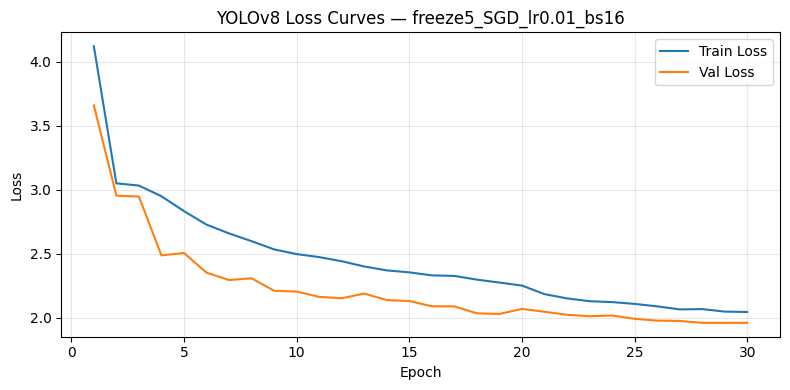

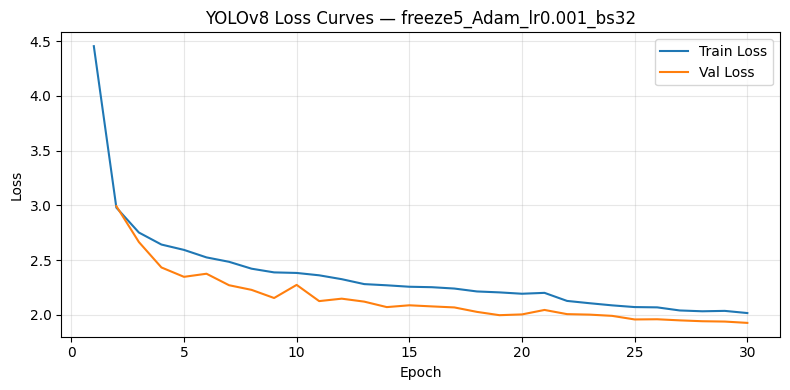

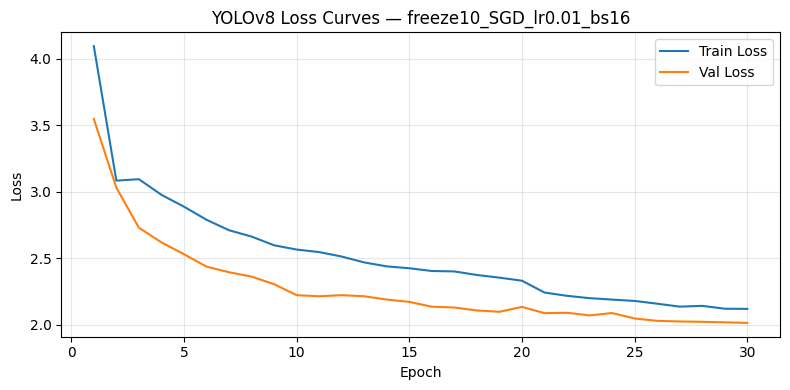

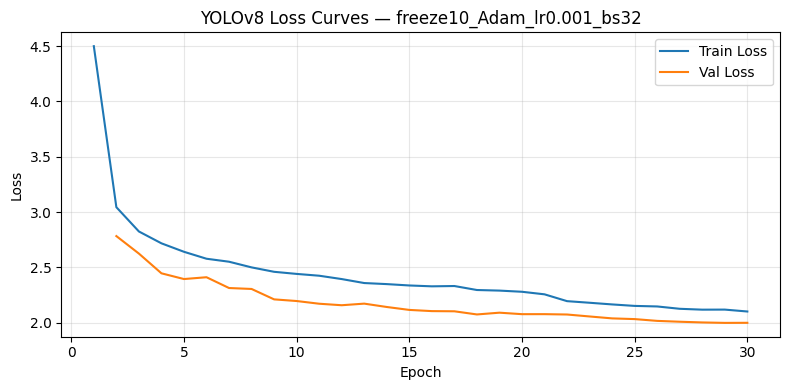

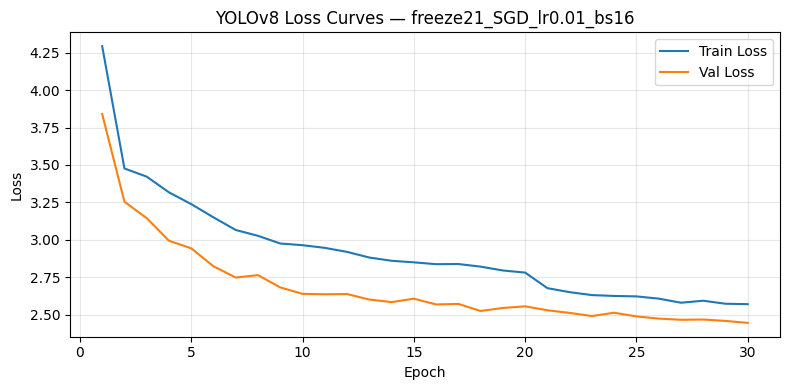

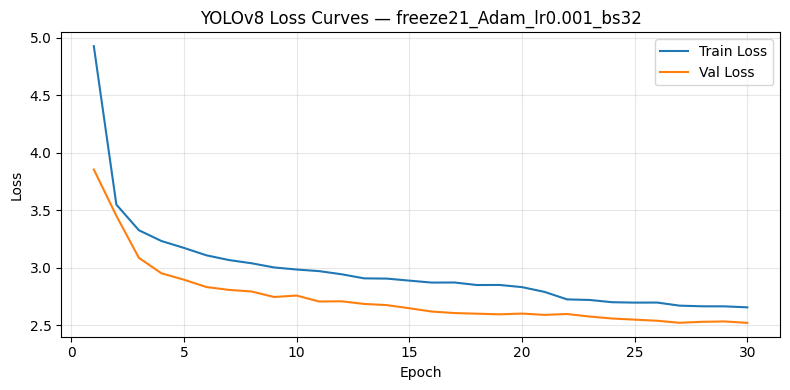

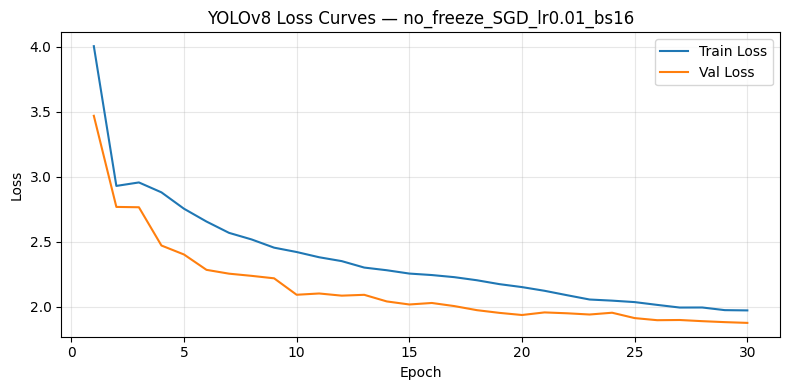

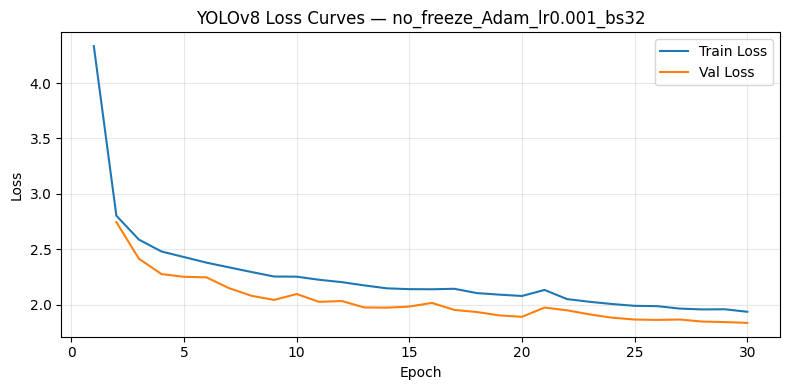

In [12]:
for exp_name in results:
    plot_yolo_loss(exp_name)

**This function visualizes the training and validation loss curves for a given experiment. It reads the `results.csv` file generated by YOLOv8 during training. If the total loss columns (`train/loss` and `val/loss`) are missing, they are reconstructed by summing the box, class, and distribution focal losses. The function then plots the loss curves across epochs, helping to evaluate model convergence and compare training behaviors across different configurations.**


### Find best experiment (by val mAP@50) for each freeze setting

In [13]:
best_models = {}

val_results = []

for fs_name, fs_value in freeze_settings.items():
    candidates = [f"{fs_name}_{hp['name']}" for hp in hyperparams]
    for exp in candidates:
        weights = f"runs/train/{exp}/weights/best.pt"
        det_metrics = YOLO(weights).val(data=data_yaml, split='val', verbose=False)
        _, _, map50, _ = det_metrics.mean_results()
        val_results.append({
            "freeze":     fs_name,
            "experiment": exp,
            "mAP50":      map50
        })


Ultralytics 8.3.140 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.3±0.1 ms, read: 282.8±207.2 MB/s, size: 1314.1 KB)


val: Scanning /content/drive/MyDrive/cars_dataset/labels/val.cache... 200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 200/200 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.98it/s]


                   all        200      11906      0.992       0.98      0.994      0.809
Speed: 0.7ms preprocess, 1.5ms inference, 0.0ms loss, 5.9ms postprocess per image
Results saved to runs/detect/val
Ultralytics 8.3.140 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.2±0.1 ms, read: 490.2±143.5 MB/s, size: 1370.8 KB)


val: Scanning /content/drive/MyDrive/cars_dataset/labels/val.cache... 200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 200/200 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.98it/s]


                   all        200      11906      0.993       0.98      0.994      0.809
Speed: 0.7ms preprocess, 1.3ms inference, 0.0ms loss, 6.9ms postprocess per image
Results saved to runs/detect/val2
Ultralytics 8.3.140 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.2±0.0 ms, read: 668.7±153.9 MB/s, size: 1378.1 KB)


val: Scanning /content/drive/MyDrive/cars_dataset/labels/val.cache... 200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 200/200 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.99it/s]


                   all        200      11906      0.991      0.975      0.993      0.797
Speed: 0.7ms preprocess, 1.2ms inference, 0.0ms loss, 5.8ms postprocess per image
Results saved to runs/detect/val3
Ultralytics 8.3.140 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.2±0.1 ms, read: 727.8±106.1 MB/s, size: 1515.3 KB)


val: Scanning /content/drive/MyDrive/cars_dataset/labels/val.cache... 200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 200/200 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  2.00it/s]


                   all        200      11906      0.991      0.975      0.993      0.796
Speed: 0.7ms preprocess, 0.8ms inference, 0.0ms loss, 6.8ms postprocess per image
Results saved to runs/detect/val4
Ultralytics 8.3.140 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.2±0.1 ms, read: 643.7±95.4 MB/s, size: 1380.1 KB)


val: Scanning /content/drive/MyDrive/cars_dataset/labels/val.cache... 200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 200/200 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.97it/s]


                   all        200      11906       0.97      0.938      0.977      0.721
Speed: 0.8ms preprocess, 0.8ms inference, 0.0ms loss, 6.4ms postprocess per image
Results saved to runs/detect/val5
Ultralytics 8.3.140 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.3±0.1 ms, read: 504.4±65.5 MB/s, size: 1389.1 KB)


val: Scanning /content/drive/MyDrive/cars_dataset/labels/val.cache... 200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 200/200 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.92it/s]


                   all        200      11906      0.969      0.933      0.976      0.712
Speed: 0.6ms preprocess, 0.9ms inference, 0.0ms loss, 4.0ms postprocess per image
Results saved to runs/detect/val6
Ultralytics 8.3.140 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.2±0.0 ms, read: 503.5±239.9 MB/s, size: 1231.0 KB)


val: Scanning /content/drive/MyDrive/cars_dataset/labels/val.cache... 200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 200/200 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.95it/s]


                   all        200      11906      0.993      0.982      0.994      0.822
Speed: 0.7ms preprocess, 0.8ms inference, 0.0ms loss, 5.4ms postprocess per image
Results saved to runs/detect/val7
Ultralytics 8.3.140 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.2±0.1 ms, read: 642.6±120.0 MB/s, size: 1292.6 KB)


val: Scanning /content/drive/MyDrive/cars_dataset/labels/val.cache... 200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 200/200 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  2.01it/s]


                   all        200      11906      0.993      0.983      0.994      0.826
Speed: 0.7ms preprocess, 1.6ms inference, 0.0ms loss, 6.4ms postprocess per image
Results saved to runs/detect/val8


In [15]:
# Build a DataFrame and show it
df_val = pd.DataFrame(val_results)
print("\nAll validation mAP@50 results:")
print(df_val)

#  Extract the best experiment per freeze setting
best_df = (
    df_val
    .sort_values("mAP50", ascending=False)
    .groupby("freeze",   as_index=False)
    .first()
)

print("\nBest experiment for each freeze setting:")
print(best_df)

# 4) (Optional) turn that into a dict if you still want best_models
best_models = dict(zip(best_df["freeze"], best_df["experiment"]))


All validation mAP@50 results:
      freeze                   experiment     mAP50
0    freeze5      freeze5_SGD_lr0.01_bs16  0.993783
1    freeze5    freeze5_Adam_lr0.001_bs32  0.993837
2   freeze10     freeze10_SGD_lr0.01_bs16  0.993131
3   freeze10   freeze10_Adam_lr0.001_bs32  0.993481
4   freeze21     freeze21_SGD_lr0.01_bs16  0.976821
5   freeze21   freeze21_Adam_lr0.001_bs32  0.976326
6  no_freeze    no_freeze_SGD_lr0.01_bs16  0.993865
7  no_freeze  no_freeze_Adam_lr0.001_bs32  0.993989

Best experiment for each freeze setting:
      freeze                   experiment     mAP50
0   freeze10   freeze10_Adam_lr0.001_bs32  0.993481
1   freeze21     freeze21_SGD_lr0.01_bs16  0.976821
2    freeze5    freeze5_Adam_lr0.001_bs32  0.993837
3  no_freeze  no_freeze_Adam_lr0.001_bs32  0.993989


**In this step, the trained models are evaluated on the validation set to identify the best-performing configuration for each freeze setting. For every combination of freeze level and hyperparameter setup, the corresponding trained model is loaded and evaluated using YOLOv8’s `.val()` function. The `mAP@50` score is extracted and stored. All results are compiled into a `DataFrame`, and then sorted to find the top-performing model (highest `mAP@50`) for each freeze level. These best models are saved in a dictionary (`best_models`) for use in final testing.**

### Evaluation of Hyperparameters: Optimizer, Learning Rate, and Batch Size

In this section, we analyze the effects of different learning hyperparameters—namely optimizer type, learning rate, and batch size—on the performance of the YOLOv8 model under varying degrees of layer freezing. Two optimizers were tested: **SGD with a learning rate of 0.01 and batch size of 16**, and **Adam with a learning rate of 0.001 and batch size of 32**. The evaluation includes both **quantitative results** (mAP@50 on validation set) and **training dynamics** (loss curves).

---

#### 1. Performance Comparison Using mAP@50

The table below summarizes the mAP@50 scores achieved by each model on the validation set:

| Freeze Setting | Optimizer & Params    | mAP@50         |
| -------------- | --------------------- | -------------- |
| freeze5        | SGD, lr=0.01, bs=16   | 0.993783       |
| freeze5        | Adam, lr=0.001, bs=32 | **0.993837**  |
| freeze10       | SGD, lr=0.01, bs=16   | 0.993131       |
| freeze10       | Adam, lr=0.001, bs=32 | **0.993481**  |
| freeze21       | SGD, lr=0.01, bs=16   | **0.976821**  |
| freeze21       | Adam, lr=0.001, bs=32 | 0.976326       |
| no_freeze      | SGD, lr=0.01, bs=16   | 0.993865       |
| no_freeze      | Adam, lr=0.001, bs=32 | **0.993989**  |

Across all configurations, **Adam with a lower learning rate and larger batch size** generally outperformed SGD. The best result overall was achieved by the `no_freeze_Adam_lr0.001_bs32` configuration, yielding a **mAP@50 of 0.993989**. Notably, fully training the model (no freezing) consistently led to better accuracy compared to heavily frozen variants such as `freeze21`.

---

#### 2. Loss Curve Analysis

The loss plots show consistent patterns across all settings. All models demonstrate a **rapid decrease in loss during the first few epochs**, followed by gradual convergence. Several key observations can be made:

- **Adam-based models tend to converge faster and exhibit lower validation loss compared to SGD-based models**, indicating better generalization and stability.
- For `freeze5` and `freeze10`, validation loss remains consistently below training loss, suggesting that the models are not overfitting.
- In the `freeze21` setting, both models show slower convergence and higher loss overall, likely due to insufficient trainable parameters.
- In the `no_freeze` setting, the model benefits from full backpropagation and shows stable, low validation losses throughout training.

---

#### 3. Discussion and Insights

The results clearly demonstrate that the choice of **optimizer and learning rate has a significant effect** on both training efficiency and final accuracy. The **Adam optimizer**, with its adaptive learning capability, performs more robustly across different freezing strategies. Moreover, a **larger batch size (32)** appears to stabilize the training process, especially when using Adam.

On the other hand, **SGD**—although still competitive in shallow freeze settings—lags slightly behind in deeper configurations due to its simpler gradient update mechanism.

**Overall**, minimal or no freezing **combined with Adam and a conservative learning rate** yields the **best performance** in this drone-based car detection task. These findings suggest that allowing the network full learning capacity and using adaptive optimizers is crucial, especially in object detection tasks with fine localization requirements.


### Evaluate each selected model on the TEST split

In [16]:
label_dir   = Path('/content/drive/MyDrive/cars_dataset/labels/test')
test_folder = '/content/drive/MyDrive/cars_dataset/images/test'

# Prepare summary list
summary = []


# Loop over your best models
for fs_name, exp in best_models.items():
    weights = f"runs/train/{exp}/weights/best.pt"
    model   = YOLO(weights)

    # 1) Detection metrics
    det_metrics = model.val(data=data_yaml, split='test', verbose=False)
    prec, rec, _, _ = det_metrics.mean_results()

    # 2) Counting metrics
    preds, trues = [], []
    for r in model.predict(source=test_folder, conf=0.25, verbose=False):
        stem     = Path(r.path).stem
        true_cnt = len((label_dir/f"{stem}.txt").read_text().splitlines())
        pred_cnt = len(r.boxes)
        preds.append(pred_cnt)
        trues.append(true_cnt)
    preds = np.array(preds)
    trues = np.array(trues)
    ema = (preds == trues).mean() * 100
    mse = ((preds - trues)**2).mean()

    # 3) Append to summary
    summary.append({
        'freeze'                : fs_name,
        'experiment'            : exp,
        'precision'             : prec,
        'recall'                : rec,
        'exact_match_accuracy'  : ema,
        'mse'                   : mse
    })

Ultralytics 8.3.140 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.5±0.4 ms, read: 3.3±2.4 MB/s, size: 1467.3 KB)


val: Scanning /content/drive/MyDrive/cars_dataset/labels/test.cache... 200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 200/200 [00:00<?, ?it/s]

val: /content/drive/MyDrive/cars_dataset/images/test/20161225_TPZ_00437.png: 1 duplicate labels removed



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:40<00:00,  3.10s/it]


                   all        200      13391       0.99      0.971      0.992      0.795
Speed: 0.6ms preprocess, 0.8ms inference, 0.0ms loss, 8.1ms postprocess per image
Results saved to runs/detect/val9
Ultralytics 8.3.140 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 4.1±8.6 ms, read: 297.5±264.0 MB/s, size: 1445.2 KB)


val: Scanning /content/drive/MyDrive/cars_dataset/labels/test.cache... 200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 200/200 [00:00<?, ?it/s]

val: /content/drive/MyDrive/cars_dataset/images/test/20161225_TPZ_00437.png: 1 duplicate labels removed



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.92it/s]


                   all        200      13391       0.97       0.93      0.975       0.72
Speed: 0.8ms preprocess, 0.9ms inference, 0.0ms loss, 5.9ms postprocess per image
Results saved to runs/detect/val10
Ultralytics 8.3.140 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.2±0.1 ms, read: 534.7±60.2 MB/s, size: 1448.9 KB)


val: Scanning /content/drive/MyDrive/cars_dataset/labels/test.cache... 200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 200/200 [00:00<?, ?it/s]

val: /content/drive/MyDrive/cars_dataset/images/test/20161225_TPZ_00437.png: 1 duplicate labels removed



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.98it/s]


                   all        200      13391      0.991      0.975      0.993      0.813
Speed: 0.7ms preprocess, 1.2ms inference, 0.0ms loss, 7.0ms postprocess per image
Results saved to runs/detect/val11
Ultralytics 8.3.140 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.2±0.1 ms, read: 560.8±141.5 MB/s, size: 1536.5 KB)


val: Scanning /content/drive/MyDrive/cars_dataset/labels/test.cache... 200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 200/200 [00:00<?, ?it/s]

val: /content/drive/MyDrive/cars_dataset/images/test/20161225_TPZ_00437.png: 1 duplicate labels removed



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.89it/s]


                   all        200      13391      0.992      0.978      0.994      0.827
Speed: 0.7ms preprocess, 0.8ms inference, 0.0ms loss, 5.8ms postprocess per image
Results saved to runs/detect/val12


In [17]:
print("=== Test Summary ===")
for row in summary:
    print(f"Freeze: {row['freeze']:10s} | "
          f"Exp: {row['experiment']:30s} | "
          f"Precision: {row['precision']:.4f} | "
          f"Recall: {row['recall']:.4f} | "
          f"EMA: {row['exact_match_accuracy']:.2f}% | "
          f"MSE: {row['mse']:.4f}")

=== Test Summary ===
Freeze: freeze10   | Exp: freeze10_Adam_lr0.001_bs32     | Precision: 0.9898 | Recall: 0.9705 | EMA: 36.00% | MSE: 7.1250
Freeze: freeze21   | Exp: freeze21_SGD_lr0.01_bs16       | Precision: 0.9700 | Recall: 0.9304 | EMA: 7.50% | MSE: 198.2250
Freeze: freeze5    | Exp: freeze5_Adam_lr0.001_bs32      | Precision: 0.9910 | Recall: 0.9746 | EMA: 36.00% | MSE: 7.5650
Freeze: no_freeze  | Exp: no_freeze_Adam_lr0.001_bs32    | Precision: 0.9918 | Recall: 0.9775 | EMA: 40.50% | MSE: 5.8250


**In this final step, the best models from each freeze setting are evaluated on the test set. For each model, both detection and counting metrics are calculated. Detection metrics include precision and recall, obtained via YOLOv8’s `.val()` method. For counting, the number of predicted and ground-truth bounding boxes is compared for each image. The exact match accuracy (EMA) measures the percentage of images where the predicted and true car counts are equal, while the mean squared error (MSE) captures the average squared difference in counts. All results are stored in a summary list and printed for comparison.**


### Final Comparison and Performance Analysis on Test Set

The table below summarizes the test performance of the best models from each training configuration based on the freezing strategy:

| Freeze Setting | Precision  | Recall     | EMA (%)   | MSE        |
| -------------- | ---------- | ---------- | --------- | ---------- |
| freeze10       | 0.9898     | 0.9705     | 36.00     | 7.1250     |
| freeze21       | 0.9700     | 0.9304     | 7.50      | 198.225    |
| freeze5        | 0.9910     | 0.9746     | 36.00     | 7.5650     |
| no_freeze      | **0.9918** | **0.9775** | **40.50** | **5.8250** |

The model trained without freezing (`no_freeze_Adam_lr0.001_bs32`) achieved the best overall performance across all metrics. It attained the highest **precision** (0.9918) and **recall** (0.9775), along with the highest **exact match accuracy (EMA)** of 40.5% and the **lowest mean squared error (MSE)** of 5.825. This indicates strong generalization capability and highly accurate car counting.

In contrast, the `freeze21` configuration significantly underperformed with the **lowest recall (0.9304)**, **lowest EMA (7.5%)**, and a **very high MSE (198.225)**. This shows that freezing too many layers restricts the model’s ability to adapt to dataset-specific features, especially in a dense and complex task like vehicle detection from aerial views.

Models with moderate freezing (`freeze5` and `freeze10`) performed relatively well but still fell short of the fully trainable configuration. Interestingly, the `freeze5` model achieved slightly better precision and recall than `freeze10`, but both yielded identical EMA scores and similar MSE values.

---

#### Observations

These results suggest that full fine-tuning (no layer freezing) allows the model to learn the most effective representations for both detection and counting tasks. While moderate freezing can still achieve high detection scores, it slightly reduces counting precision. On the other hand, aggressive freezing severely harms performance.

---

#### Recommendations for Improvement

- Always prefer **no freezing** or **minimal freezing** when computational resources allow.
- Apply **data augmentation** or **domain-specific regularization** to further boost generalization.
- Explore **post-processing** techniques such as non-maximum suppression tuning or **ensemble methods** for improved box filtering and stability.
- Incorporate **count-aware loss terms** to directly optimize counting accuracy in dense object scenes.


### Visualize TP (green) and Missed GT (red) for each of your 4 best models

### IoU helper

In [18]:
def iou_xyxy(boxA, boxB):
    xA, yA = max(boxA[0], boxB[0]), max(boxA[1], boxB[1])
    xB, yB = min(boxA[2], boxB[2]), min(boxA[3], boxB[3])
    interW, interH = max(0, xB-xA), max(0, yB-yA)
    inter = interW * interH
    areaA = (boxA[2]-boxA[0])*(boxA[3]-boxA[1])
    areaB = (boxB[2]-boxB[0])*(boxB[3]-boxB[1])
    union = areaA + areaB - inter
    return inter/union if union>0 else 0


 freeze10_Adam_lr0.001_bs32 on 20160331_NTU_00058.png


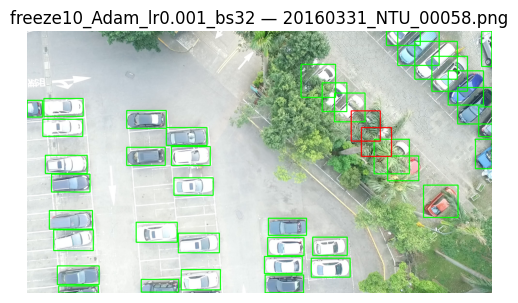


 freeze21_SGD_lr0.01_bs16 on 20160331_NTU_00058.png


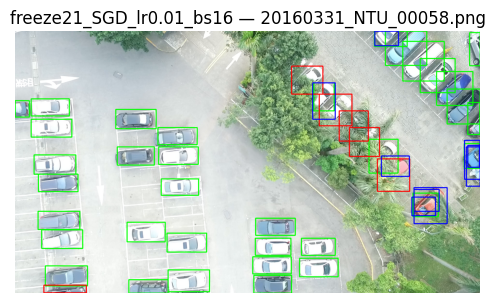


 freeze5_Adam_lr0.001_bs32 on 20160331_NTU_00058.png


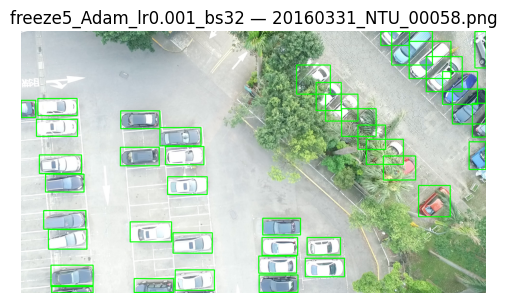


 no_freeze_Adam_lr0.001_bs32 on 20160331_NTU_00058.png


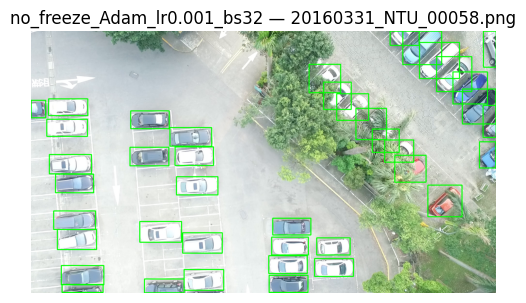

In [19]:
test_folder = Path('/content/drive/MyDrive/cars_dataset/images/test')
image_name  = '20160331_NTU_00058.png'
img_path    = test_folder / image_name

# Loop through your best models and visualize this one image
for fs_name, exp in best_models.items():
    print(f"\n {exp} on {image_name}")
    model = YOLO(f"runs/train/{exp}/weights/best.pt")

    # 1) load image once
    img = cv2.imread(str(img_path))
    h, w = img.shape[:2]

    # 2) predict
    res        = model.predict(source=str(img_path), conf=0.25, verbose=False)[0]
    pred_boxes = res.boxes.xyxy.cpu().numpy()

    # 3) load GT
    gt_boxes = []
    for line in (label_dir/f"{img_path.stem}.txt").read_text().splitlines():
        cls, x_c, y_c, bw, bh = map(float, line.split())
        x1 = (x_c - bw/2) * w;  y1 = (y_c - bh/2) * h
        x2 = (x_c + bw/2) * w;  y2 = (y_c + bh/2) * h
        gt_boxes.append([x1,y1,x2,y2])

    # 4) match preds→GT
    matched_gt   = set()
    matched_pred = set()
    for i_pred, pb in enumerate(pred_boxes):
        for i_gt, gb in enumerate(gt_boxes):
            if i_gt not in matched_gt and iou_xyxy(pb, gb) >= 0.5:
                matched_gt.add(i_gt)
                matched_pred.add(i_pred)
                cv2.rectangle(img, (int(pb[0]),int(pb[1])),
                                 (int(pb[2]),int(pb[3])),
                                 (0,255,0), 2)  # TP green
                break

    # 5) draw missed GT (red) and false pos (blue)
    for i_gt, gb in enumerate(gt_boxes):
        if i_gt not in matched_gt:
            cv2.rectangle(img, (int(gb[0]),int(gb[1])),
                             (int(gb[2]),int(gb[3])),
                             (0,0,255), 2)       # FN red

    for i_pred, pb in enumerate(pred_boxes):
        if i_pred not in matched_pred:
            cv2.rectangle(img, (int(pb[0]),int(pb[1])),
                             (int(pb[2]),int(pb[3])),
                             (255,0,0), 2)       # FP blue

    # 6) display
    rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(6,6))
    plt.imshow(rgb)
    plt.title(f"{exp} — {image_name}")
    plt.axis('off')
    plt.show()

**In this section, bounding box predictions from each of the best-performing models are visualized on a selected test image. Green boxes represent true positives (correct detections), red boxes indicate false negatives (missed cars), and blue boxes show false positives (incorrect detections). These visualizations provide qualitative insight into the performance of different training settings. Models trained with minimal or no freezing (e.g., `no_freeze_Adam_lr0.001_bs32`) exhibit highly accurate detection with almost all cars correctly identified and minimal missed or false detections. In contrast, the model with the most frozen layers (`freeze21_SGD_lr0.01_bs16`) shows noticeably more missed cars and incorrect predictions. Overall, the visual comparisons confirm that allowing the model to fully learn (i.e., no freezing) and using adaptive optimizers leads to more precise and complete car detection in dense parking lot scenes.**



 freeze10_Adam_lr0.001_bs32 (freeze10)


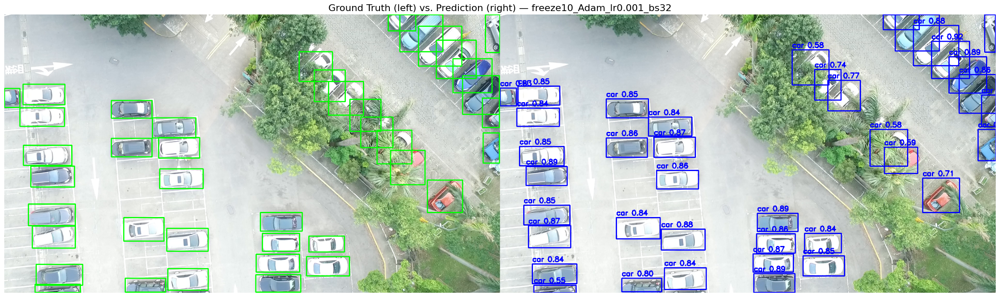


 freeze21_SGD_lr0.01_bs16 (freeze21)


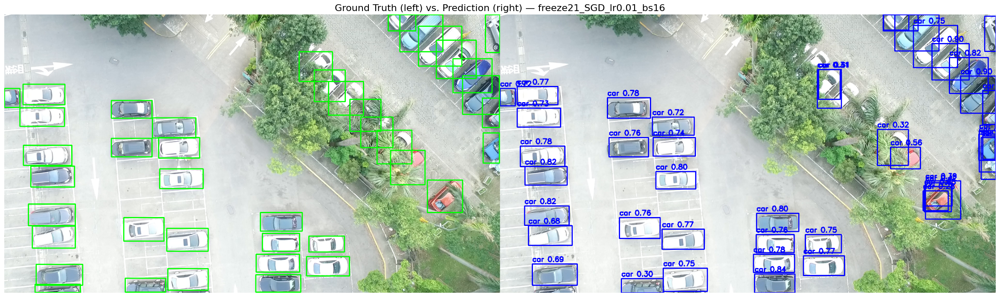


 freeze5_Adam_lr0.001_bs32 (freeze5)


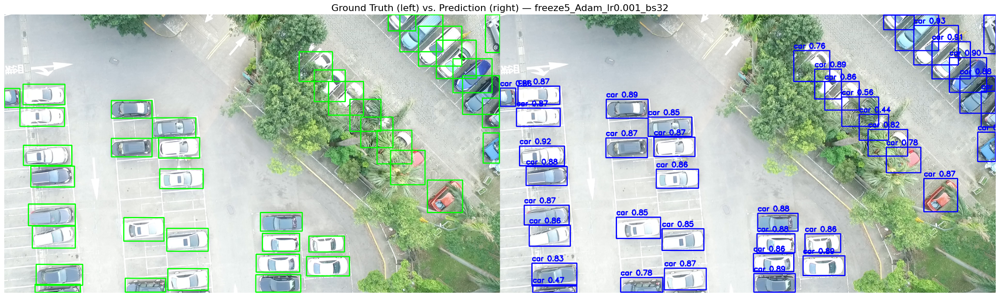


 no_freeze_Adam_lr0.001_bs32 (no_freeze)


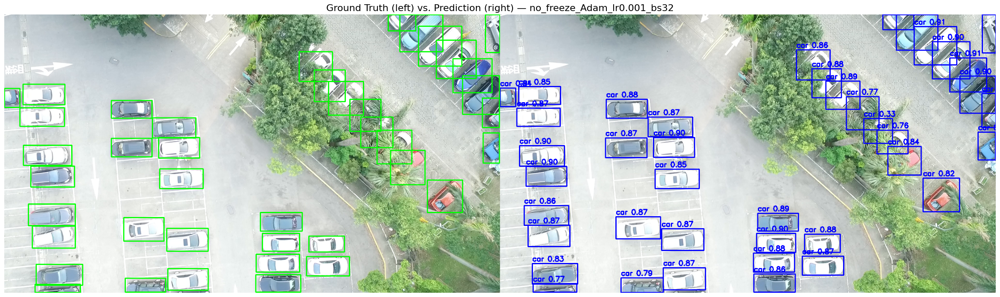

In [20]:
for fs_name, exp in best_models.items():
    print(f"\n {exp} ({fs_name})")
    model = YOLO(f"runs/train/{exp}/weights/best.pt")

    orig   = cv2.imread(str(img_path))
    gt_img = orig.copy()
    pd_img = orig.copy()
    h, w   = orig.shape[:2]

    # Ground-truth (green)
    for line in (label_dir/f"{img_path.stem}.txt").read_text().splitlines():
        cls, x_c, y_c, bw, bh = map(float, line.split())
        x1 = int((x_c - bw/2) * w);  y1 = int((y_c - bh/2) * h)
        x2 = int((x_c + bw/2) * w);  y2 = int((y_c + bh/2) * h)
        cv2.rectangle(gt_img, (x1,y1), (x2,y2), (0,255,0), 2)

    # Predictions (blue + score)
    res         = model.predict(source=str(img_path), conf=0.25, verbose=False)[0]
    pred_boxes  = res.boxes.xyxy.cpu().numpy()
    conf_scores = res.boxes.conf.cpu().numpy()
    for (x1,y1,x2,y2), conf in zip(pred_boxes, conf_scores):
        x1,y1,x2,y2 = map(int, (x1,y1,x2,y2))
        cv2.rectangle(pd_img, (x1,y1), (x2,y2), (255,0,0), 2)
        cv2.putText(pd_img, f"car {conf:.2f}", (x1, y1-6),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255,0,0), 2)

    # Side-by-side display with larger figure
    gt_rgb = cv2.cvtColor(gt_img, cv2.COLOR_BGR2RGB)
    pd_rgb = cv2.cvtColor(pd_img, cv2.COLOR_BGR2RGB)
    concat = np.hstack((gt_rgb, pd_rgb))

    plt.figure(figsize=(30,20))
    plt.imshow(concat)
    plt.axis('off')
    plt.title(f"Ground Truth (left) vs. Prediction (right) — {exp}", fontsize=16)
    plt.show()

**To further evaluate detection performance, ground-truth annotations (left) and model predictions (right) are visualized side by side for each freeze configuration. In the prediction images, each detected object is labeled with its class and confidence score. These visualizations provide a clearer understanding of not only which cars were detected but also the confidence levels and spatial alignment of predictions.**

**The comparison reveals that the model trained without any frozen layers (`no_freeze_Adam_lr0.001_bs32`) yields the most accurate and confident predictions, with tight alignment between predicted and ground-truth boxes and minimal errors. In contrast, the model with the most frozen layers (`freeze21_SGD_lr0.01_bs16`) shows a higher number of missed detections and several low-confidence predictions, particularly around occluded or partially visible vehicles. Intermediate configurations such as `freeze5` and `freeze10` show reasonable performance, but still fall short of the full training setup.**

**These visuals support the quantitative findings and confirm that reducing layer freezing and using adaptive optimizers improves not only numerical accuracy but also the quality and confidence of the detections.**


#  ── YOLO‐Architecture Hyperparameter Sweep ──


### Define Your YOLO‐specific Hyperparameter Sets

In [21]:
yolo_arch_params = [
    {'name':'default',    'iou':0.7, 'box':7.5,  'dfl':1.5},
    {'name':'high_iou',   'iou':0.8, 'box':7.5,  'dfl':1.5},
    {'name':'low_iou',    'iou':0.6, 'box':7.5,  'dfl':1.5},
    {'name':'high_box',   'iou':0.7, 'box':10.0, 'dfl':1.5},
    {'name':'high_dfl',   'iou':0.7, 'box':7.5,  'dfl':2.0},
]


In [22]:
# storage for Results
results_arch = {}

### ─── 2) Train each variant ─────────────────────────────────────────────────────

In [23]:
for hp in yolo_arch_params:
    exp = hp['name']
    print(f"\n Training arch‐hp '{exp}' …")
    model = YOLO('yolov8n.pt')
    res   = model.train(
        data=data_yaml,
        epochs=epochs,
        imgsz=imgsz,
        batch=hp.get('batch', 16),
        iou=hp['iou'],
        box=hp['box'],
        dfl=hp['dfl'],
        name=exp,
        project='runs/arch_hp',
        exist_ok=True
    )
    results_arch[exp] = res


 Training arch‐hp 'default' …
Ultralytics 8.3.140 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/cars_dataset/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=default, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, 

train: Scanning /content/drive/MyDrive/cars_dataset/labels/train.cache... 1000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1000/1000 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


WARNING ⚠️ val: Slow image access detected (ping: 97.2±216.0 ms, read: 207.6±210.2 MB/s, size: 1312.4 KB). Use local storage instead of remote/mounted storage for better performance. See https://docs.ultralytics.com/guides/model-training-tips/


val: Scanning /content/drive/MyDrive/cars_dataset/labels/val.cache... 200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 200/200 [00:00<?, ?it/s]


Plotting labels to runs/arch_hp/default/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/arch_hp/default
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      6.46G      1.367       1.73      0.983        808        640: 100%|██████████| 63/63 [00:11<00:00,  5.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.21it/s]

                   all        200      11906      0.956      0.929      0.962      0.697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30       7.4G      1.103     0.7057     0.8995        740        640: 100%|██████████| 63/63 [00:09<00:00,  6.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.13it/s]

                   all        200      11906      0.967      0.957      0.979      0.741



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30       7.4G       1.04     0.6202     0.8854       1137        640: 100%|██████████| 63/63 [00:09<00:00,  6.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.03it/s]

                   all        200      11906      0.989      0.963      0.989      0.745



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      7.41G     0.9936     0.5873     0.8765       1051        640: 100%|██████████| 63/63 [00:09<00:00,  6.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.98it/s]

                   all        200      11906       0.99       0.97      0.991      0.774



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      7.42G     0.9826      0.566     0.8749        932        640: 100%|██████████| 63/63 [00:09<00:00,  6.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.74it/s]

                   all        200      11906      0.992      0.972      0.992      0.783



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      7.42G     0.9439     0.5353     0.8676        643        640: 100%|██████████| 63/63 [00:09<00:00,  6.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.86it/s]

                   all        200      11906       0.99      0.972      0.992      0.776



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      7.42G     0.9222     0.5192     0.8619        660        640: 100%|██████████| 63/63 [00:09<00:00,  6.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.83it/s]

                   all        200      11906      0.989      0.979      0.993      0.791



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      7.44G     0.9066     0.5062     0.8594       1059        640: 100%|██████████| 63/63 [00:09<00:00,  6.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.83it/s]

                   all        200      11906       0.99      0.979      0.993      0.787



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      7.45G      0.893      0.498     0.8571        657        640: 100%|██████████| 63/63 [00:09<00:00,  6.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.06it/s]

                   all        200      11906      0.993      0.978      0.994      0.799



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      7.45G     0.8764     0.4822     0.8535       1005        640: 100%|██████████| 63/63 [00:09<00:00,  6.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.16it/s]

                   all        200      11906      0.992      0.979      0.994      0.792



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      7.45G     0.8872     0.4743     0.8534        868        640: 100%|██████████| 63/63 [00:09<00:00,  6.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.29it/s]

                   all        200      11906       0.99      0.981      0.994      0.803



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      7.45G      0.867     0.4727     0.8514        600        640: 100%|██████████| 63/63 [00:09<00:00,  6.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.42it/s]

                   all        200      11906      0.991      0.984      0.994      0.807



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      7.45G     0.8509     0.4604     0.8492        815        640: 100%|██████████| 63/63 [00:09<00:00,  6.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.13it/s]

                   all        200      11906      0.993      0.982      0.994      0.808



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      8.41G     0.8377     0.4484     0.8468        710        640: 100%|██████████| 63/63 [00:09<00:00,  6.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.17it/s]

                   all        200      11906      0.992      0.981      0.994      0.812



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      8.41G     0.8347     0.4448     0.8437       1045        640: 100%|██████████| 63/63 [00:09<00:00,  6.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.16it/s]

                   all        200      11906      0.993      0.981      0.994      0.817



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      8.41G     0.8245     0.4383     0.8422       1069        640: 100%|██████████| 63/63 [00:09<00:00,  6.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.22it/s]

                   all        200      11906      0.994      0.982      0.994       0.81



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      8.41G      0.827     0.4368     0.8419       1222        640: 100%|██████████| 63/63 [00:09<00:00,  6.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.54it/s]

                   all        200      11906      0.992      0.983      0.994      0.816



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      8.41G      0.812      0.427     0.8401        595        640: 100%|██████████| 63/63 [00:09<00:00,  6.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.73it/s]

                   all        200      11906      0.991      0.984      0.994      0.816



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      8.41G      0.803     0.4208     0.8389        582        640: 100%|██████████| 63/63 [00:09<00:00,  6.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.30it/s]

                   all        200      11906      0.993      0.984      0.994      0.822



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      8.41G     0.7999     0.4154     0.8379       1067        640: 100%|██████████| 63/63 [00:09<00:00,  6.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.32it/s]

                   all        200      11906      0.993      0.982      0.994      0.821


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      8.41G     0.7812     0.4236     0.8374        379        640: 100%|██████████| 63/63 [00:10<00:00,  6.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.83it/s]

                   all        200      11906      0.992       0.98      0.994      0.798



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      8.41G      0.766     0.4052     0.8354        618        640: 100%|██████████| 63/63 [00:08<00:00,  7.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.85it/s]

                   all        200      11906      0.992      0.981      0.994      0.815



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      8.41G     0.7657     0.3985     0.8366        509        640: 100%|██████████| 63/63 [00:08<00:00,  7.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.29it/s]

                   all        200      11906      0.994      0.982      0.994      0.819



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      8.41G     0.7534      0.388     0.8321        545        640: 100%|██████████| 63/63 [00:08<00:00,  7.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.26it/s]

                   all        200      11906      0.993      0.984      0.994       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      8.41G     0.7479     0.3838     0.8318        533        640: 100%|██████████| 63/63 [00:08<00:00,  7.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.34it/s]

                   all        200      11906      0.993      0.983      0.994      0.822



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      8.41G     0.7359     0.3771     0.8306        476        640: 100%|██████████| 63/63 [00:08<00:00,  7.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.17it/s]

                   all        200      11906      0.994      0.984      0.994      0.828



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      8.41G      0.724     0.3735     0.8289        549        640: 100%|██████████| 63/63 [00:08<00:00,  7.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.48it/s]

                   all        200      11906      0.991      0.986      0.994      0.827



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      8.41G     0.7222     0.3712     0.8291        363        640: 100%|██████████| 63/63 [00:08<00:00,  7.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.21it/s]

                   all        200      11906      0.993      0.984      0.994      0.831



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      8.41G     0.7112     0.3644     0.8253        453        640: 100%|██████████| 63/63 [00:08<00:00,  7.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.60it/s]

                   all        200      11906      0.991      0.986      0.994      0.833



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      8.41G     0.7082     0.3601     0.8252        475        640: 100%|██████████| 63/63 [00:08<00:00,  7.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.99it/s]

                   all        200      11906      0.992      0.985      0.994      0.833



30 epochs completed in 0.092 hours.
Optimizer stripped from runs/arch_hp/default/weights/last.pt, 6.2MB
Optimizer stripped from runs/arch_hp/default/weights/best.pt, 6.2MB

Validating runs/arch_hp/default/weights/best.pt...
Ultralytics 8.3.140 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.29it/s]


                   all        200      11906      0.992      0.985      0.994      0.833
Speed: 0.1ms preprocess, 0.5ms inference, 0.0ms loss, 1.4ms postprocess per image
Results saved to runs/arch_hp/default

 Training arch‐hp 'high_iou' …
Ultralytics 8.3.140 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/cars_dataset/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.8, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, m

train: Scanning /content/drive/MyDrive/cars_dataset/labels/train.cache... 1000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1000/1000 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 1.5±0.8 ms, read: 115.4±109.4 MB/s, size: 1312.4 KB)


val: Scanning /content/drive/MyDrive/cars_dataset/labels/val.cache... 200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 200/200 [00:00<?, ?it/s]


Plotting labels to runs/arch_hp/high_iou/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/arch_hp/high_iou
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      6.49G      1.367       1.73      0.983        808        640: 100%|██████████| 63/63 [00:11<00:00,  5.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.08it/s]

                   all        200      11906      0.939      0.912      0.953      0.694



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      7.45G      1.103     0.7057     0.8995        740        640: 100%|██████████| 63/63 [00:09<00:00,  6.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.11it/s]

                   all        200      11906      0.954      0.947      0.976      0.742



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      7.46G       1.04     0.6202     0.8854       1137        640: 100%|██████████| 63/63 [00:10<00:00,  6.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.95it/s]

                   all        200      11906      0.982      0.958      0.987      0.747



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      7.46G     0.9936     0.5873     0.8765       1051        640: 100%|██████████| 63/63 [00:09<00:00,  6.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.75it/s]

                   all        200      11906      0.984      0.966       0.99      0.775



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      7.46G     0.9826      0.566     0.8749        932        640: 100%|██████████| 63/63 [00:09<00:00,  6.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.87it/s]

                   all        200      11906      0.986      0.966      0.991      0.784



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      7.46G     0.9439     0.5353     0.8676        643        640: 100%|██████████| 63/63 [00:09<00:00,  6.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.88it/s]

                   all        200      11906      0.988      0.966      0.991      0.777



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      7.46G     0.9222     0.5192     0.8619        660        640: 100%|██████████| 63/63 [00:09<00:00,  6.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.50it/s]

                   all        200      11906      0.985      0.972      0.992      0.793



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      7.46G     0.9066     0.5062     0.8594       1059        640: 100%|██████████| 63/63 [00:09<00:00,  6.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.68it/s]

                   all        200      11906      0.989      0.973      0.993      0.789



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      7.46G      0.893      0.498     0.8571        657        640: 100%|██████████| 63/63 [00:09<00:00,  6.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.96it/s]

                   all        200      11906      0.989      0.975      0.993        0.8



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      7.46G     0.8764     0.4822     0.8535       1005        640: 100%|██████████| 63/63 [00:09<00:00,  6.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.27it/s]

                   all        200      11906       0.99      0.976      0.993      0.793



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      7.48G     0.8872     0.4743     0.8534        868        640: 100%|██████████| 63/63 [00:09<00:00,  6.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.37it/s]

                   all        200      11906       0.99      0.975      0.993      0.804



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      7.49G      0.867     0.4727     0.8514        600        640: 100%|██████████| 63/63 [00:09<00:00,  6.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.19it/s]

                   all        200      11906       0.99      0.978      0.994      0.807



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      7.49G     0.8509     0.4604     0.8492        815        640: 100%|██████████| 63/63 [00:09<00:00,  6.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.36it/s]

                   all        200      11906       0.99      0.979      0.994       0.81



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      8.45G     0.8377     0.4484     0.8468        710        640: 100%|██████████| 63/63 [00:09<00:00,  6.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.95it/s]

                   all        200      11906      0.991      0.977      0.993      0.813



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      8.47G     0.8347     0.4448     0.8437       1045        640: 100%|██████████| 63/63 [00:09<00:00,  6.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.90it/s]

                   all        200      11906       0.99      0.978      0.994      0.818



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      8.47G     0.8245     0.4383     0.8422       1069        640: 100%|██████████| 63/63 [00:09<00:00,  6.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.05it/s]

                   all        200      11906      0.993       0.98      0.994      0.812



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      8.47G      0.827     0.4368     0.8419       1222        640: 100%|██████████| 63/63 [00:09<00:00,  6.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.19it/s]

                   all        200      11906      0.989      0.981      0.994      0.817



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      8.47G      0.812      0.427     0.8401        595        640: 100%|██████████| 63/63 [00:09<00:00,  6.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.57it/s]

                   all        200      11906       0.99      0.981      0.994      0.816



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      8.47G      0.803     0.4208     0.8389        582        640: 100%|██████████| 63/63 [00:09<00:00,  6.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.56it/s]

                   all        200      11906       0.99      0.982      0.994      0.822



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      8.47G     0.7999     0.4154     0.8379       1067        640: 100%|██████████| 63/63 [00:09<00:00,  6.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.36it/s]

                   all        200      11906      0.991       0.98      0.994      0.821


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      8.47G     0.7812     0.4236     0.8374        379        640: 100%|██████████| 63/63 [00:10<00:00,  6.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.96it/s]

                   all        200      11906      0.991      0.976      0.993        0.8



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      8.47G      0.766     0.4052     0.8354        618        640: 100%|██████████| 63/63 [00:08<00:00,  7.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.78it/s]

                   all        200      11906      0.992      0.977      0.994      0.815



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      8.47G     0.7657     0.3985     0.8366        509        640: 100%|██████████| 63/63 [00:08<00:00,  7.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.26it/s]

                   all        200      11906      0.992      0.981      0.994       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      8.47G     0.7534      0.388     0.8321        545        640: 100%|██████████| 63/63 [00:08<00:00,  7.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.21it/s]

                   all        200      11906       0.99      0.982      0.994       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      8.47G     0.7479     0.3838     0.8318        533        640: 100%|██████████| 63/63 [00:08<00:00,  7.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.34it/s]

                   all        200      11906      0.991       0.98      0.994      0.823



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      8.47G     0.7359     0.3771     0.8306        476        640: 100%|██████████| 63/63 [00:08<00:00,  7.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.24it/s]

                   all        200      11906       0.99      0.982      0.994      0.828



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      8.47G      0.724     0.3735     0.8289        549        640: 100%|██████████| 63/63 [00:08<00:00,  7.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.46it/s]

                   all        200      11906      0.992      0.979      0.994      0.827



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      8.47G     0.7222     0.3712     0.8291        363        640: 100%|██████████| 63/63 [00:08<00:00,  7.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.71it/s]

                   all        200      11906      0.992      0.981      0.994      0.831



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      8.47G     0.7112     0.3644     0.8253        453        640: 100%|██████████| 63/63 [00:08<00:00,  7.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.37it/s]

                   all        200      11906      0.991      0.981      0.994      0.832



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      8.47G     0.7082     0.3601     0.8252        475        640: 100%|██████████| 63/63 [00:08<00:00,  7.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.10it/s]

                   all        200      11906      0.993       0.98      0.994      0.833



30 epochs completed in 0.092 hours.
Optimizer stripped from runs/arch_hp/high_iou/weights/last.pt, 6.2MB
Optimizer stripped from runs/arch_hp/high_iou/weights/best.pt, 6.2MB

Validating runs/arch_hp/high_iou/weights/best.pt...
Ultralytics 8.3.140 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.29it/s]


                   all        200      11906      0.993       0.98      0.994      0.833
Speed: 0.1ms preprocess, 0.5ms inference, 0.0ms loss, 1.4ms postprocess per image
Results saved to runs/arch_hp/high_iou

 Training arch‐hp 'low_iou' …
Ultralytics 8.3.140 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/cars_dataset/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.6, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, m

train: Scanning /content/drive/MyDrive/cars_dataset/labels/train.cache... 1000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1000/1000 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


WARNING ⚠️ val: Slow image access detected (ping: 70.3±155.7 ms, read: 224.1±213.1 MB/s, size: 1312.4 KB). Use local storage instead of remote/mounted storage for better performance. See https://docs.ultralytics.com/guides/model-training-tips/


val: Scanning /content/drive/MyDrive/cars_dataset/labels/val.cache... 200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 200/200 [00:00<?, ?it/s]


Plotting labels to runs/arch_hp/low_iou/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/arch_hp/low_iou
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      6.48G      1.367       1.73      0.983        808        640: 100%|██████████| 63/63 [00:11<00:00,  5.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.17it/s]

                   all        200      11906      0.966      0.936      0.967      0.699



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      7.45G      1.103     0.7057     0.8995        740        640: 100%|██████████| 63/63 [00:09<00:00,  6.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.87it/s]

                   all        200      11906      0.974       0.96      0.982      0.741



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      7.45G       1.04     0.6202     0.8854       1137        640: 100%|██████████| 63/63 [00:09<00:00,  6.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.22it/s]

                   all        200      11906       0.99      0.966       0.99      0.744



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      7.45G     0.9936     0.5873     0.8765       1051        640: 100%|██████████| 63/63 [00:09<00:00,  6.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.18it/s]

                   all        200      11906       0.99      0.973      0.992      0.772



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      7.45G     0.9826      0.566     0.8749        932        640: 100%|██████████| 63/63 [00:09<00:00,  6.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.98it/s]

                   all        200      11906      0.992      0.974      0.993      0.782



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      7.45G     0.9439     0.5353     0.8676        643        640: 100%|██████████| 63/63 [00:09<00:00,  6.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.84it/s]

                   all        200      11906      0.991      0.974      0.993      0.775



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      7.45G     0.9222     0.5192     0.8619        660        640: 100%|██████████| 63/63 [00:09<00:00,  6.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.03it/s]

                   all        200      11906      0.992      0.979      0.993      0.791



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      7.45G     0.9066     0.5062     0.8594       1059        640: 100%|██████████| 63/63 [00:09<00:00,  6.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.25it/s]

                   all        200      11906      0.991      0.981      0.994      0.787



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      7.45G      0.893      0.498     0.8571        657        640: 100%|██████████| 63/63 [00:09<00:00,  6.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.15it/s]

                   all        200      11906      0.992       0.98      0.994      0.798



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      7.45G     0.8764     0.4822     0.8535       1005        640: 100%|██████████| 63/63 [00:09<00:00,  6.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.19it/s]

                   all        200      11906      0.993      0.979      0.994      0.792



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      7.46G     0.8872     0.4743     0.8534        868        640: 100%|██████████| 63/63 [00:09<00:00,  6.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.14it/s]

                   all        200      11906      0.991      0.982      0.994      0.803



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      7.46G      0.867     0.4727     0.8514        600        640: 100%|██████████| 63/63 [00:09<00:00,  6.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.49it/s]

                   all        200      11906      0.992      0.984      0.994      0.808



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      7.46G     0.8509     0.4604     0.8492        815        640: 100%|██████████| 63/63 [00:09<00:00,  6.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.81it/s]

                   all        200      11906      0.993      0.984      0.994      0.809



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      8.41G     0.8377     0.4484     0.8468        710        640: 100%|██████████| 63/63 [00:09<00:00,  6.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.05it/s]

                   all        200      11906      0.993      0.982      0.994      0.812



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      8.44G     0.8347     0.4448     0.8437       1045        640: 100%|██████████| 63/63 [00:09<00:00,  6.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.69it/s]

                   all        200      11906      0.992      0.984      0.994      0.817



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      8.45G     0.8245     0.4383     0.8422       1069        640: 100%|██████████| 63/63 [00:09<00:00,  6.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.49it/s]

                   all        200      11906      0.993      0.982      0.994       0.81



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      8.45G      0.827     0.4368     0.8419       1222        640: 100%|██████████| 63/63 [00:09<00:00,  6.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.52it/s]

                   all        200      11906      0.992      0.984      0.994      0.817



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      8.45G      0.812      0.427     0.8401        595        640: 100%|██████████| 63/63 [00:09<00:00,  6.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.55it/s]

                   all        200      11906      0.992      0.985      0.994      0.816



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      8.45G      0.803     0.4208     0.8389        582        640: 100%|██████████| 63/63 [00:09<00:00,  6.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.58it/s]

                   all        200      11906      0.994      0.985      0.994      0.821



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      8.45G     0.7999     0.4154     0.8379       1067        640: 100%|██████████| 63/63 [00:09<00:00,  6.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.23it/s]

                   all        200      11906      0.993      0.984      0.994      0.821


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      8.45G     0.7812     0.4236     0.8374        379        640: 100%|██████████| 63/63 [00:10<00:00,  6.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.82it/s]

                   all        200      11906      0.992      0.981      0.994      0.797



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      8.45G      0.766     0.4052     0.8354        618        640: 100%|██████████| 63/63 [00:08<00:00,  7.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.95it/s]

                   all        200      11906      0.992      0.983      0.994      0.814



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      8.45G     0.7657     0.3985     0.8366        509        640: 100%|██████████| 63/63 [00:08<00:00,  7.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.05it/s]

                   all        200      11906      0.993      0.985      0.994      0.819



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      8.45G     0.7534      0.388     0.8321        545        640: 100%|██████████| 63/63 [00:08<00:00,  7.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.30it/s]

                   all        200      11906      0.993      0.985      0.994      0.819



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      8.45G     0.7479     0.3838     0.8318        533        640: 100%|██████████| 63/63 [00:08<00:00,  7.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.67it/s]

                   all        200      11906      0.992      0.985      0.994      0.823



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      8.45G     0.7359     0.3771     0.8306        476        640: 100%|██████████| 63/63 [00:08<00:00,  7.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.31it/s]

                   all        200      11906      0.994      0.984      0.994      0.828



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      8.45G      0.724     0.3735     0.8289        549        640: 100%|██████████| 63/63 [00:08<00:00,  7.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.51it/s]

                   all        200      11906      0.992      0.987      0.994      0.827



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      8.45G     0.7222     0.3712     0.8291        363        640: 100%|██████████| 63/63 [00:08<00:00,  7.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.64it/s]

                   all        200      11906      0.993      0.985      0.994      0.831



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      8.45G     0.7112     0.3644     0.8253        453        640: 100%|██████████| 63/63 [00:08<00:00,  7.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.69it/s]

                   all        200      11906      0.991      0.987      0.994      0.833



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      8.45G     0.7082     0.3601     0.8252        475        640: 100%|██████████| 63/63 [00:08<00:00,  7.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.20it/s]

                   all        200      11906      0.993      0.986      0.994      0.833



30 epochs completed in 0.092 hours.
Optimizer stripped from runs/arch_hp/low_iou/weights/last.pt, 6.2MB
Optimizer stripped from runs/arch_hp/low_iou/weights/best.pt, 6.2MB

Validating runs/arch_hp/low_iou/weights/best.pt...
Ultralytics 8.3.140 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.32it/s]


                   all        200      11906      0.993      0.986      0.994      0.833
Speed: 0.1ms preprocess, 0.5ms inference, 0.0ms loss, 1.4ms postprocess per image
Results saved to runs/arch_hp/low_iou

 Training arch‐hp 'high_box' …
Ultralytics 8.3.140 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=10.0, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/cars_dataset/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, 

train: Scanning /content/drive/MyDrive/cars_dataset/labels/train.cache... 1000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1000/1000 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


WARNING ⚠️ val: Slow image access detected (ping: 18.2±38.3 ms, read: 227.3±187.7 MB/s, size: 1312.4 KB). Use local storage instead of remote/mounted storage for better performance. See https://docs.ultralytics.com/guides/model-training-tips/


val: Scanning /content/drive/MyDrive/cars_dataset/labels/val.cache... 200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 200/200 [00:00<?, ?it/s]


Plotting labels to runs/arch_hp/high_box/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/arch_hp/high_box
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      6.49G      1.823      1.754     0.9839        808        640: 100%|██████████| 63/63 [00:11<00:00,  5.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.97it/s]

                   all        200      11906       0.95      0.924      0.959      0.697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      7.45G      1.467     0.7133     0.9008        740        640: 100%|██████████| 63/63 [00:09<00:00,  6.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.99it/s]

                   all        200      11906      0.971      0.953       0.98      0.743



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      7.45G      1.393     0.6281     0.8869       1137        640: 100%|██████████| 63/63 [00:09<00:00,  6.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.16it/s]

                   all        200      11906      0.989      0.966      0.989       0.77



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      7.45G      1.323     0.5919     0.8787       1051        640: 100%|██████████| 63/63 [00:09<00:00,  6.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.97it/s]

                   all        200      11906      0.991      0.967       0.99      0.765



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      7.45G      1.303     0.5695     0.8761        932        640: 100%|██████████| 63/63 [00:09<00:00,  6.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.65it/s]

                   all        200      11906       0.99      0.974      0.992      0.769



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      7.45G      1.234     0.5345     0.8663        643        640: 100%|██████████| 63/63 [00:09<00:00,  6.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.95it/s]

                   all        200      11906      0.988      0.972      0.992      0.784



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      7.45G      1.227     0.5235     0.8614        660        640: 100%|██████████| 63/63 [00:09<00:00,  6.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.92it/s]

                   all        200      11906      0.989      0.979      0.993      0.796



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      7.45G      1.199     0.5028     0.8583       1059        640: 100%|██████████| 63/63 [00:09<00:00,  6.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.28it/s]

                   all        200      11906      0.991      0.979      0.993      0.787



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      7.45G      1.175     0.4957     0.8561        657        640: 100%|██████████| 63/63 [00:09<00:00,  6.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.15it/s]

                   all        200      11906      0.993      0.977      0.994      0.786



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      7.45G      1.171     0.4834     0.8544       1005        640: 100%|██████████| 63/63 [00:09<00:00,  6.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.90it/s]

                   all        200      11906      0.993      0.978      0.994      0.799



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      7.45G      1.191     0.4796     0.8546        868        640: 100%|██████████| 63/63 [00:09<00:00,  6.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.55it/s]

                   all        200      11906      0.991      0.978      0.993      0.789



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      7.45G       1.16     0.4769     0.8524        600        640: 100%|██████████| 63/63 [00:09<00:00,  6.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.12it/s]

                   all        200      11906       0.99      0.981      0.994      0.806



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      7.45G      1.118     0.4573     0.8478        815        640: 100%|██████████| 63/63 [00:09<00:00,  6.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.74it/s]

                   all        200      11906      0.991      0.982      0.994      0.809



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      8.41G      1.106     0.4496     0.8463        710        640: 100%|██████████| 63/63 [00:09<00:00,  6.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.75it/s]

                   all        200      11906      0.992       0.98      0.994      0.809



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      8.41G      1.101     0.4426     0.8427       1045        640: 100%|██████████| 63/63 [00:09<00:00,  6.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.17it/s]

                   all        200      11906      0.993      0.981      0.994      0.811



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      8.42G      1.102     0.4391     0.8429       1069        640: 100%|██████████| 63/63 [00:09<00:00,  6.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.11it/s]

                   all        200      11906      0.993      0.982      0.994      0.805



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      8.43G      1.098     0.4352     0.8418       1222        640: 100%|██████████| 63/63 [00:09<00:00,  6.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.41it/s]

                   all        200      11906      0.992      0.984      0.994      0.815



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      8.43G      1.088     0.4291     0.8412        595        640: 100%|██████████| 63/63 [00:09<00:00,  6.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.41it/s]

                   all        200      11906       0.99      0.986      0.994       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      8.43G      1.074     0.4233     0.8399        582        640: 100%|██████████| 63/63 [00:09<00:00,  6.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.46it/s]

                   all        200      11906      0.993      0.983      0.994      0.815



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      8.43G      1.066      0.417     0.8385       1067        640: 100%|██████████| 63/63 [00:09<00:00,  6.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.41it/s]

                   all        200      11906      0.994      0.981      0.994      0.822


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      8.43G      1.045     0.4277     0.8379        379        640: 100%|██████████| 63/63 [00:10<00:00,  6.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.93it/s]

                   all        200      11906      0.991       0.98      0.994      0.805



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      8.43G      1.024     0.4089     0.8359        618        640: 100%|██████████| 63/63 [00:08<00:00,  7.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.64it/s]

                   all        200      11906      0.992      0.983      0.994      0.813



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      8.43G      1.015     0.4031     0.8361        509        640: 100%|██████████| 63/63 [00:08<00:00,  7.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.17it/s]

                   all        200      11906      0.992      0.984      0.994      0.816



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      8.43G      1.008     0.3956     0.8326        545        640: 100%|██████████| 63/63 [00:08<00:00,  7.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.07it/s]

                   all        200      11906      0.993      0.983      0.994      0.818



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      8.43G      1.006     0.3905     0.8328        533        640: 100%|██████████| 63/63 [00:08<00:00,  7.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.00it/s]

                   all        200      11906      0.991      0.986      0.994      0.822



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      8.43G     0.9808     0.3796     0.8309        476        640: 100%|██████████| 63/63 [00:08<00:00,  7.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.01it/s]

                   all        200      11906      0.994      0.984      0.994      0.827



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      8.43G     0.9629     0.3749     0.8289        549        640: 100%|██████████| 63/63 [00:08<00:00,  7.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.18it/s]

                   all        200      11906      0.992      0.984      0.994      0.828



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      8.43G     0.9643     0.3736     0.8296        363        640: 100%|██████████| 63/63 [00:08<00:00,  7.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.43it/s]

                   all        200      11906      0.993      0.983      0.994       0.83



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      8.44G     0.9496     0.3679     0.8259        453        640: 100%|██████████| 63/63 [00:08<00:00,  7.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.54it/s]

                   all        200      11906      0.993      0.983      0.994      0.831



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      8.44G     0.9446     0.3639     0.8256        475        640: 100%|██████████| 63/63 [00:08<00:00,  7.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.09it/s]

                   all        200      11906      0.991      0.986      0.994      0.833



30 epochs completed in 0.093 hours.
Optimizer stripped from runs/arch_hp/high_box/weights/last.pt, 6.2MB
Optimizer stripped from runs/arch_hp/high_box/weights/best.pt, 6.2MB

Validating runs/arch_hp/high_box/weights/best.pt...
Ultralytics 8.3.140 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.29it/s]


                   all        200      11906      0.991      0.986      0.994      0.833
Speed: 0.1ms preprocess, 0.5ms inference, 0.0ms loss, 1.4ms postprocess per image
Results saved to runs/arch_hp/high_box

 Training arch‐hp 'high_dfl' …
Ultralytics 8.3.140 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/cars_dataset/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=2.0, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, 

train: Scanning /content/drive/MyDrive/cars_dataset/labels/train.cache... 1000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1000/1000 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 1.4±1.2 ms, read: 230.2±177.9 MB/s, size: 1312.4 KB)


val: Scanning /content/drive/MyDrive/cars_dataset/labels/val.cache... 200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 200/200 [00:00<?, ?it/s]


Plotting labels to runs/arch_hp/high_dfl/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/arch_hp/high_dfl
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30       6.5G      1.365       1.73      1.308        808        640: 100%|██████████| 63/63 [00:11<00:00,  5.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.11it/s]

                   all        200      11906      0.954      0.925      0.961      0.695



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      7.45G      1.102     0.7061      1.197        740        640: 100%|██████████| 63/63 [00:09<00:00,  6.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.09it/s]

                   all        200      11906      0.962       0.96      0.979      0.742



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      7.45G      1.041     0.6225      1.179       1137        640: 100%|██████████| 63/63 [00:09<00:00,  6.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.98it/s]

                   all        200      11906      0.988      0.964      0.989      0.743



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      7.45G      1.008     0.5952       1.17       1051        640: 100%|██████████| 63/63 [00:09<00:00,  6.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.72it/s]

                   all        200      11906       0.99      0.964       0.99      0.771



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      7.45G      0.974     0.5671      1.164        932        640: 100%|██████████| 63/63 [00:09<00:00,  6.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.63it/s]

                   all        200      11906       0.99      0.971      0.992      0.782



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      7.45G     0.9326     0.5328      1.153        643        640: 100%|██████████| 63/63 [00:09<00:00,  6.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.71it/s]

                   all        200      11906       0.99      0.973      0.993      0.783



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      7.45G     0.9305     0.5227      1.149        660        640: 100%|██████████| 63/63 [00:09<00:00,  6.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.66it/s]

                   all        200      11906      0.989      0.977      0.993      0.779



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      7.45G      0.901     0.5021      1.143       1059        640: 100%|██████████| 63/63 [00:09<00:00,  6.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.24it/s]

                   all        200      11906      0.991      0.979      0.993        0.8



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      7.45G     0.8704     0.4898      1.137        657        640: 100%|██████████| 63/63 [00:09<00:00,  6.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.06it/s]

                   all        200      11906      0.991      0.979      0.994      0.782



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      7.45G     0.8805     0.4857      1.138       1005        640: 100%|██████████| 63/63 [00:09<00:00,  6.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.02it/s]

                   all        200      11906      0.992      0.977      0.994      0.778



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      7.45G     0.8907     0.4806      1.138        868        640: 100%|██████████| 63/63 [00:09<00:00,  6.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.05it/s]

                   all        200      11906      0.991      0.979      0.994      0.804



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      7.45G     0.8656     0.4719      1.133        600        640: 100%|██████████| 63/63 [00:09<00:00,  6.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.23it/s]

                   all        200      11906      0.993      0.981      0.994      0.802



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      7.46G     0.8369      0.453      1.128        815        640: 100%|██████████| 63/63 [00:09<00:00,  6.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.03it/s]

                   all        200      11906      0.993      0.981      0.994      0.812



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      8.42G     0.8352      0.446      1.127        710        640: 100%|██████████| 63/63 [00:09<00:00,  6.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.89it/s]

                   all        200      11906      0.993      0.981      0.994      0.812



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      8.42G     0.8288      0.442      1.122       1045        640: 100%|██████████| 63/63 [00:09<00:00,  6.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.36it/s]

                   all        200      11906      0.992       0.98      0.994      0.812



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      8.42G     0.8253     0.4368      1.122       1069        640: 100%|██████████| 63/63 [00:09<00:00,  6.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.58it/s]

                   all        200      11906      0.993      0.982      0.994      0.811



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      8.43G     0.8225     0.4335       1.12       1222        640: 100%|██████████| 63/63 [00:09<00:00,  6.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.13it/s]

                   all        200      11906      0.992      0.982      0.994      0.817



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      8.43G     0.8111     0.4272      1.119        595        640: 100%|██████████| 63/63 [00:09<00:00,  6.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.60it/s]

                   all        200      11906      0.994      0.981      0.994      0.818



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      8.43G     0.8005     0.4202      1.117        582        640: 100%|██████████| 63/63 [00:09<00:00,  6.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.25it/s]

                   all        200      11906      0.993      0.983      0.994      0.816



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      8.43G     0.8033     0.4165      1.117       1067        640: 100%|██████████| 63/63 [00:09<00:00,  6.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.53it/s]

                   all        200      11906      0.993      0.983      0.994      0.822


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      8.43G     0.7805     0.4241      1.115        379        640: 100%|██████████| 63/63 [00:10<00:00,  6.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.92it/s]

                   all        200      11906      0.992      0.979      0.994      0.801



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      8.43G     0.7674     0.4064      1.113        618        640: 100%|██████████| 63/63 [00:08<00:00,  7.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.11it/s]

                   all        200      11906      0.991      0.984      0.994      0.816



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      8.43G     0.7648     0.3986      1.114        509        640: 100%|██████████| 63/63 [00:08<00:00,  7.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.06it/s]

                   all        200      11906      0.992      0.984      0.994      0.822



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      8.43G     0.7536     0.3897      1.109        545        640: 100%|██████████| 63/63 [00:08<00:00,  7.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.06it/s]

                   all        200      11906      0.993      0.982      0.994      0.818



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      8.43G     0.7521      0.387      1.109        533        640: 100%|██████████| 63/63 [00:08<00:00,  7.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.48it/s]

                   all        200      11906       0.99      0.985      0.994      0.827



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      8.43G     0.7348     0.3771      1.106        476        640: 100%|██████████| 63/63 [00:08<00:00,  7.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.10it/s]

                   all        200      11906      0.994      0.982      0.994      0.827



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      8.43G     0.7232     0.3725      1.104        549        640: 100%|██████████| 63/63 [00:08<00:00,  7.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.43it/s]

                   all        200      11906      0.992      0.983      0.994       0.83



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      8.43G     0.7217     0.3708      1.104        363        640: 100%|██████████| 63/63 [00:08<00:00,  7.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.47it/s]

                   all        200      11906      0.994      0.983      0.994      0.831



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      8.43G     0.7117     0.3643      1.099        453        640: 100%|██████████| 63/63 [00:08<00:00,  7.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.57it/s]

                   all        200      11906      0.992      0.984      0.994      0.834



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      8.43G     0.7075       0.36      1.099        475        640: 100%|██████████| 63/63 [00:08<00:00,  7.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.12it/s]

                   all        200      11906      0.992      0.984      0.994      0.833



30 epochs completed in 0.092 hours.
Optimizer stripped from runs/arch_hp/high_dfl/weights/last.pt, 6.2MB
Optimizer stripped from runs/arch_hp/high_dfl/weights/best.pt, 6.2MB

Validating runs/arch_hp/high_dfl/weights/best.pt...
Ultralytics 8.3.140 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.30it/s]


                   all        200      11906      0.992      0.984      0.994      0.834
Speed: 0.1ms preprocess, 0.5ms inference, 0.0ms loss, 1.4ms postprocess per image
Results saved to runs/arch_hp/high_dfl


**In this part of the study, the effects of specific architectural parameters in the YOLOv8 model are investigated. Five different configurations are tested by varying the values of the `iou`, `box`, and `dfl` parameters while keeping the remaining hyperparameters (e.g., learning rate, batch size) constant or at default values. The `iou` parameter defines the Intersection over Union threshold used during training to determine whether a predicted box is a positive sample. Higher values of `iou` (e.g., 0.8) impose stricter matching criteria, which may lead to more precise detections but fewer training positives. Conversely, lower `iou` thresholds (e.g., 0.6) may increase recall but introduce more noise.**

**The `box` parameter controls the weight of the bounding box regression loss in the overall training objective. Increasing this value forces the model to focus more on precise box localization, which can be beneficial in dense object scenes but may lead to overfitting if set too high. The `dfl` parameter refers to Distribution Focal Loss, which improves bounding box accuracy by modeling uncertainty in localization. A higher `dfl` value gives more importance to fine-grained localization predictions.**

**These architectural experiments aim to evaluate how such low-level configurations impact the model’s performance independently of traditional hyperparameters like optimizer or learning rate. Although tuning these parameters offers the potential to improve accuracy and stability, it can also make training more sensitive and harder to converge if the values are not well aligned with the dataset characteristics.**


### ───  Plot train vs. val loss for each variant ───────────────────────────────


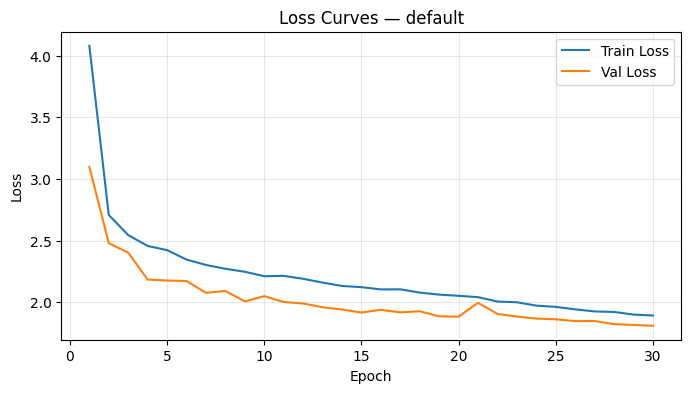

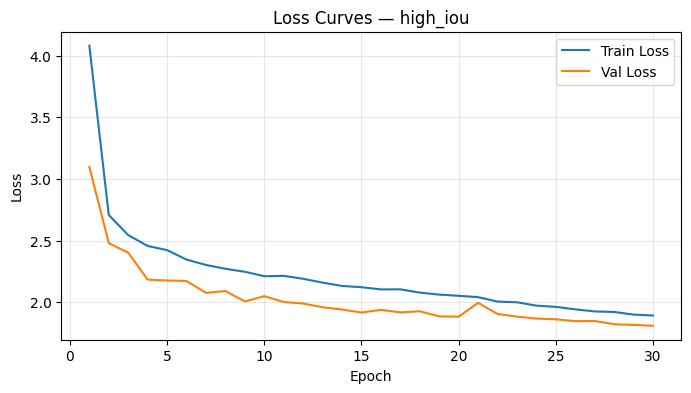

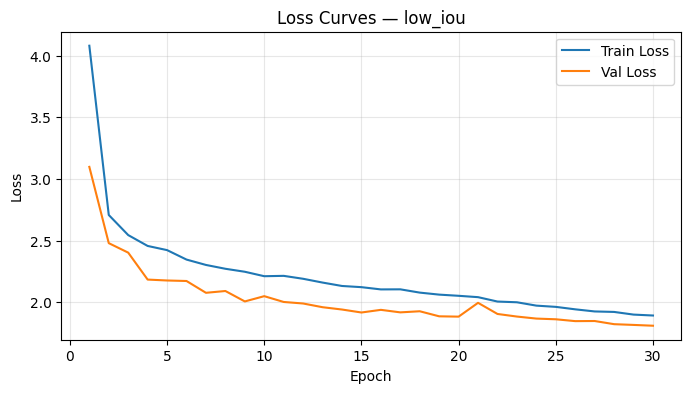

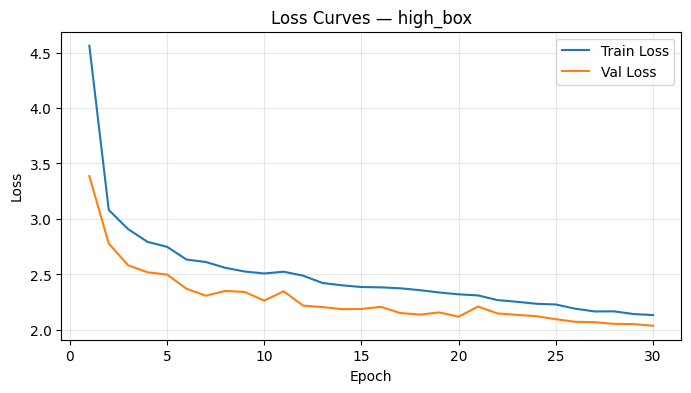

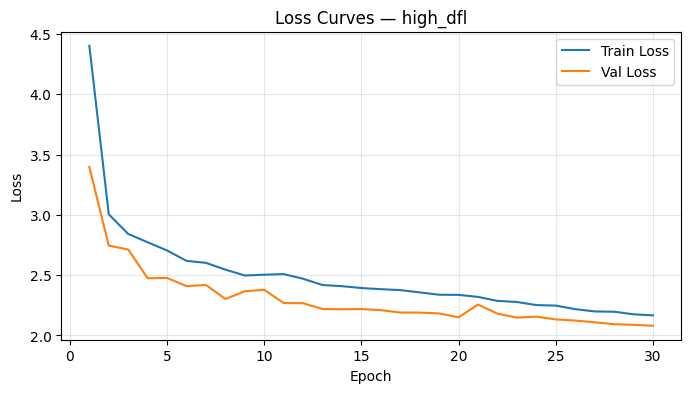

In [24]:
def plot_yolo_loss_specific(exp_name: str):
    csv_path = Path(f"runs/arch_hp/{exp_name}/results.csv")
    df = pd.read_csv(csv_path)

    # Sum the correct "_loss" columns
    df['train_loss'] = (
        df['train/box_loss'] +
        df['train/cls_loss'] +
        df['train/dfl_loss']
    )
    df['val_loss'] = (
        df['val/box_loss'] +
        df['val/cls_loss'] +
        df['val/dfl_loss']
    )

    # Plot
    plt.figure(figsize=(8,4))
    plt.plot(df['epoch'], df['train_loss'], label='Train Loss')
    plt.plot(df['epoch'], df['val_loss'],   label='Val Loss')
    plt.title(f"Loss Curves — {exp_name}")
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(alpha=0.3)
    plt.show()

# Usage
for exp in results_arch:
    plot_yolo_loss_specific(exp)


**To analyze the training behavior of models with different architectural settings, loss curves are plotted for each experiment. The `plot_yolo_loss_specific` function reads the `results.csv` file generated during training and computes the total training and validation loss by summing the individual components: box loss, classification loss, and distribution focal loss. These values are plotted across epochs to visualize model convergence. By comparing these plots, we can observe how changes in YOLO-specific parameters affect training dynamics, such as stability, overfitting, or underfitting.**


### ───  Evaluate on TEST: Precision, Recall, EMA & MSE ────────────────────────


In [25]:
summary_arch = []
for exp in results_arch:
    weights = f"runs/arch_hp/{exp}/weights/best.pt"
    model   = YOLO(weights)

    # detection metrics
    det = model.val(data=data_yaml, split='test', verbose=False)
    prec, rec, _, _ = det.mean_results()

    # counting metrics (EMA, MSE)
    preds, trues = [], []
    for r in model.predict(source=str(test_folder), conf=0.25, verbose=False):
        stem     = Path(r.path).stem
        true_cnt = len((label_dir/f"{stem}.txt").read_text().splitlines())
        pred_cnt = len(r.boxes)
        preds.append(pred_cnt);  trues.append(true_cnt)
    preds = np.array(preds);  trues = np.array(trues)
    ema = (preds == trues).mean() * 100
    mse = ((preds - trues)**2).mean()

    # final losses from CSV
    df = pd.read_csv(f"runs/arch_hp/{exp}/results.csv")
    total_train = (df['train/box_loss'] +
                  df['train/cls_loss'] +
                  df['train/dfl_loss'])
    total_val   = (df['val/box_loss']   +
                  df['val/cls_loss']   +
                  df['val/dfl_loss'])

    final_train = total_train.iloc[-1]
    final_val   = total_val.iloc[-1]

    summary_arch.append({
        'experiment':       exp,
        'precision':        prec,
        'recall':           rec,
        'ExactMatchAcc ':    ema,
        'MSE':               mse,
        'final_train_loss': final_train,
        'final_val_loss':   final_val
    })

Ultralytics 8.3.140 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.2±0.1 ms, read: 576.8±140.4 MB/s, size: 1383.4 KB)


val: Scanning /content/drive/MyDrive/cars_dataset/labels/test.cache... 200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 200/200 [00:00<?, ?it/s]

val: /content/drive/MyDrive/cars_dataset/images/test/20161225_TPZ_00437.png: 1 duplicate labels removed



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.96it/s]


                   all        200      13391      0.994      0.982      0.994      0.837
Speed: 0.7ms preprocess, 0.9ms inference, 0.0ms loss, 6.1ms postprocess per image
Results saved to runs/detect/val13
Ultralytics 8.3.140 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.3±0.1 ms, read: 524.9±97.2 MB/s, size: 1417.7 KB)


val: Scanning /content/drive/MyDrive/cars_dataset/labels/test.cache... 200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 200/200 [00:00<?, ?it/s]

val: /content/drive/MyDrive/cars_dataset/images/test/20161225_TPZ_00437.png: 1 duplicate labels removed



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.96it/s]


                   all        200      13391      0.994      0.982      0.994      0.837
Speed: 0.8ms preprocess, 0.9ms inference, 0.0ms loss, 4.8ms postprocess per image
Results saved to runs/detect/val14
Ultralytics 8.3.140 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.2±0.1 ms, read: 602.8±100.9 MB/s, size: 1514.9 KB)


val: Scanning /content/drive/MyDrive/cars_dataset/labels/test.cache... 200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 200/200 [00:00<?, ?it/s]

val: /content/drive/MyDrive/cars_dataset/images/test/20161225_TPZ_00437.png: 1 duplicate labels removed



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  2.02it/s]


                   all        200      13391      0.994      0.982      0.994      0.837
Speed: 0.7ms preprocess, 0.8ms inference, 0.0ms loss, 8.2ms postprocess per image
Results saved to runs/detect/val15
Ultralytics 8.3.140 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.2±0.0 ms, read: 446.0±213.6 MB/s, size: 1428.2 KB)


val: Scanning /content/drive/MyDrive/cars_dataset/labels/test.cache... 200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 200/200 [00:00<?, ?it/s]

val: /content/drive/MyDrive/cars_dataset/images/test/20161225_TPZ_00437.png: 1 duplicate labels removed



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.96it/s]


                   all        200      13391      0.993      0.981      0.994      0.838
Speed: 0.7ms preprocess, 0.8ms inference, 0.0ms loss, 6.3ms postprocess per image
Results saved to runs/detect/val16
Ultralytics 8.3.140 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.2±0.0 ms, read: 657.0±145.7 MB/s, size: 1444.1 KB)


val: Scanning /content/drive/MyDrive/cars_dataset/labels/test.cache... 200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 200/200 [00:00<?, ?it/s]

val: /content/drive/MyDrive/cars_dataset/images/test/20161225_TPZ_00437.png: 1 duplicate labels removed



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  2.00it/s]


                   all        200      13391      0.991      0.983      0.994      0.837
Speed: 0.7ms preprocess, 0.8ms inference, 0.0ms loss, 3.6ms postprocess per image
Results saved to runs/detect/val17


In [26]:
df_arch = pd.DataFrame(summary_arch)
print("\nAll arch‐hp experiment metrics:")
display(df_arch)   


All arch‐hp experiment metrics:


,experiment,precision,recall,ExactMatchAcc,MSE,final_train_loss,final_val_loss
0,default,0.993875,0.981545,46.0,4.355,1.89346,1.81067
1,high_iou,0.993875,0.981545,46.0,4.355,1.89346,1.81067
2,low_iou,0.993875,0.981545,46.0,4.355,1.89346,1.81067
3,high_box,0.992595,0.981039,44.0,5.135,2.13402,2.03803
4,high_dfl,0.990721,0.983123,44.0,3.855,2.16652,2.08062


**In this section, we evaluate the performance of models trained with different YOLO-specific architectural parameters on the test set. For each model, both detection metrics (precision and recall) and counting metrics (exact match accuracy and mean squared error) are computed. Exact match accuracy measures the percentage of test images where the predicted car count exactly matches the ground-truth count, while MSE quantifies the average squared error in predicted counts. Additionally, the final training and validation loss values are extracted from each model’s training log to assess generalization performance. All metrics are collected into a summary table (`df_arch`) to facilitate comparison across different architecture configurations and to identify which combination yields the best trade-off between detection accuracy, count reliability, and training stability.**


### Evaluation of YOLO-Specific Architectural Hyperparameters

In this section, we explore how tuning internal YOLOv8 architecture-specific hyperparameters — such as **IoU threshold (`iou`)**, **box loss weight (`box`)**, and **Distribution Focal Loss factor (`dfl`)** — affects detection and counting performance. Five experiments were conducted by modifying one architectural parameter at a time, while keeping the optimizer (default Adam), learning rate, and other training conditions constant.

---

#### 1. Quantitative Performance Summary

The results of each experiment on the test set are summarized in the following table:

| Experiment | Precision | Recall | Exact Match Acc (%) | MSE   | Final Train Loss | Final Val Loss |
| ---------- | --------- | ------ | ------------------- | ----- | ---------------- | -------------- |
| default    | 0.993875  | 0.9815 | 46.0                | 4.355 | 1.89346          | 1.81067        |
| high_iou   | 0.993875  | 0.9815 | 46.0                | 4.355 | 1.89346          | 1.81067        |
| low_iou    | 0.993875  | 0.9815 | 46.0                | 4.355 | 1.89346          | 1.81067        |
| high_box   | 0.992595  | 0.9810 | 44.0                | 5.135 | 2.13402          | 2.03803        |
| high_dfl   | 0.990721  | 0.9831 | 44.0                | 3.855 | 2.16652          | 2.08062        |

The `default`, `high_iou`, and `low_iou` configurations yielded identical precision, recall, and counting metrics, indicating that **modifying the IoU threshold alone had minimal effect** in this context. This is likely because the dataset annotations and predictions were already well-aligned, and a threshold variation between 0.6–0.8 did not change the classification of matches significantly.

On the other hand, increasing the **box loss weight (`high_box`)** slightly decreased precision and increased MSE, suggesting over-emphasis on bounding box localization may have led to suboptimal balance with classification. Similarly, increasing the **Distribution Focal Loss factor (`high_dfl`)** resulted in the lowest MSE (3.855) but also the **highest training and validation losses**, which may indicate instability or difficulty in learning fine-grained localization features.

---

#### 2. Loss Curve Analysis

The loss curves for all configurations show smooth convergence over 30 epochs, with the steepest drop occurring in the early epochs. Key takeaways include:

- `default`, `high_iou`, and `low_iou` models have nearly identical loss curves, supporting the performance parity seen in the metrics.
- The `high_box` configuration starts with higher loss and converges more slowly, especially in validation, reflecting reduced generalization.
- The `high_dfl` model shows the most fluctuation in validation loss, which could suggest that too much emphasis on precise box regression (via DFL) may destabilize training in this task.

Despite having slightly worse loss metrics, the **default configuration** remains the most balanced across detection, localization, and counting performance.

---

#### 3. Discussion and Insights

These results highlight that **YOLOv8's default architectural settings are already well-optimized** for typical object detection tasks like this one. Adjusting the `iou` parameter had negligible effect, indicating the model's performance is not particularly sensitive to IoU threshold selection within a reasonable range.

However, increasing the **box regression** or **DFL weights** can slightly improve certain aspects (e.g., MSE) but at the cost of overall loss and model stability. Therefore, unless the task explicitly prioritizes localization precision, it is often more effective to retain the default values.

In conclusion, **architectural tuning should be applied cautiously**, and only when the task requirements justify it. For this car counting problem, the **default YOLOv8 settings provided the best trade-off between accuracy, stability, and generalization**.


### Bounding Box Predictions

In [27]:
def iou_xyxy(boxA, boxB):
    xA, yA = max(boxA[0], boxB[0]), max(boxA[1], boxB[1])
    xB, yB = min(boxA[2], boxB[2]), min(boxA[3], boxB[3])
    inter = max(0, xB-xA) * max(0, yB-yA)
    areaA = (boxA[2]-boxA[0])*(boxA[3]-boxA[1])
    areaB = (boxB[2]-boxB[0])*(boxB[3]-boxB[1])
    return inter / (areaA + areaB - inter) if (areaA+areaB-inter)>0 else 0


▶ default on 20160331_NTU_00058.png

▶ high_iou on 20160331_NTU_00058.png

▶ low_iou on 20160331_NTU_00058.png

▶ high_box on 20160331_NTU_00058.png

▶ high_dfl on 20160331_NTU_00058.png


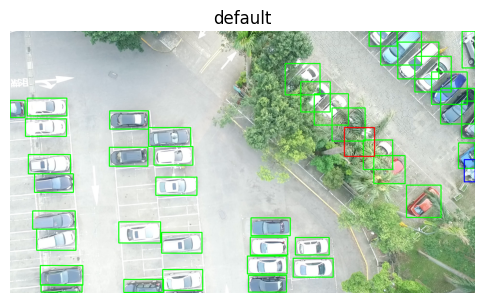

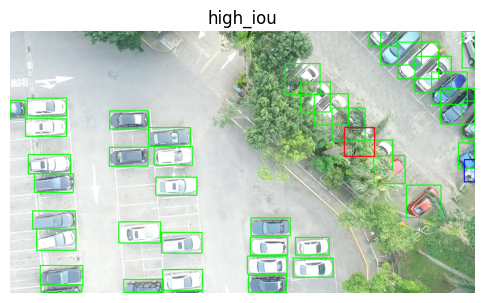

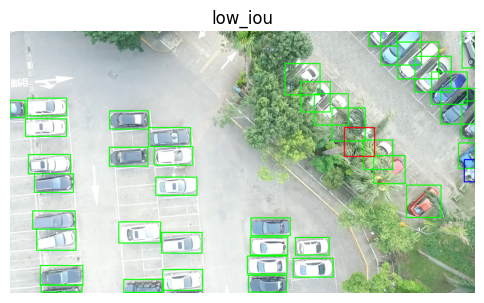

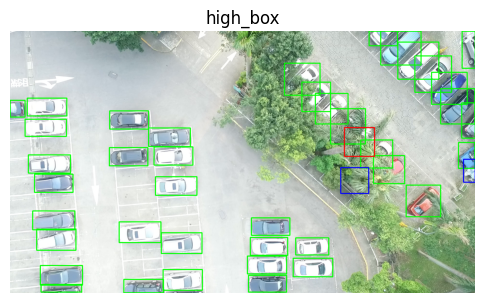

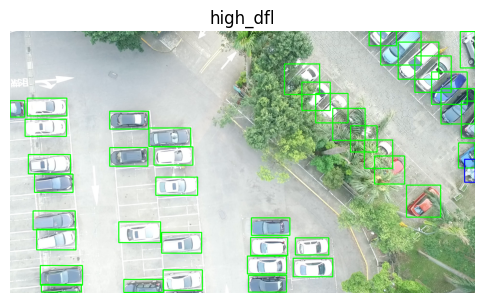

In [28]:
for exp in df_arch['experiment']:
    print(f"\n▶ {exp} on {image_name}")
    model = YOLO(f"runs/arch_hp/{exp}/weights/best.pt")
    img   = cv2.imread(str(img_path));  h,w = img.shape[:2]

    # preds
    res        = model.predict(source=str(img_path), conf=0.25, verbose=False)[0]
    pred_boxes = res.boxes.xyxy.cpu().numpy()

    # load GT
    gt_boxes = []
    for row in (label_dir/f"{img_path.stem}.txt").read_text().splitlines():
        cls,x_c,y_c,bw,bh = map(float, row.split())
        x1,y1 = (x_c-bw/2)*w, (y_c-bh/2)*h
        x2,y2 = (x_c+bw/2)*w, (y_c+bh/2)*h
        gt_boxes.append([x1,y1,x2,y2])

    # match & draw
    matched_gt, matched_pred = set(), set()
    for i,pb in enumerate(pred_boxes):
        for j,gb in enumerate(gt_boxes):
            if j not in matched_gt and iou_xyxy(pb,gb)>=0.5:
                matched_gt.add(j);  matched_pred.add(i)
                cv2.rectangle(img, (int(pb[0]),int(pb[1])),
                                 (int(pb[2]),int(pb[3])), (0,255,0), 2)
                break

    for i,gb in enumerate(gt_boxes):
        if i not in matched_gt:
            cv2.rectangle(img, (int(gb[0]),int(gb[1])),
                             (int(gb[2]),int(gb[3])), (0,0,255), 2)
    for i,pb in enumerate(pred_boxes):
        if i not in matched_pred:
            cv2.rectangle(img, (int(pb[0]),int(pb[1])),
                             (int(pb[2]),int(pb[3])), (255,0,0), 2)

    # show
    rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(6,6))
    plt.imshow(rgb); plt.axis('off')
    plt.title(f"{exp}")

**The figures below show the bounding box predictions of models trained with different architecture-specific settings such as `high_iou`, `low_iou`, `high_box`, and `high_dfl`, compared against the `default` configuration. Green boxes indicate true positives, red boxes mark missed detections, and blue boxes denote false positives. Across all settings, the default model provides consistently accurate predictions with minimal error. The `high_iou` and `low_iou` configurations yield nearly identical results, confirming that variations in IoU threshold within the tested range have negligible visual impact.**

**However, the `high_box` model introduces more false positives (e.g., incorrectly detected vehicles near foliage), likely due to over-penalization of bounding box localization, which may have led the model to aggressively fit bounding shapes. On the other hand, the `high_dfl` configuration shows slightly more confident and tighter boxes around vehicles, aligning with its lower MSE, although the visual difference remains subtle.**

**Overall, these visualizations reinforce that YOLOv8's default architectural parameters offer a balanced performance, and that modifying internal architecture settings should be done cautiously, as gains in one metric may come with trade-offs in others such as stability or overfitting risk.**



 default


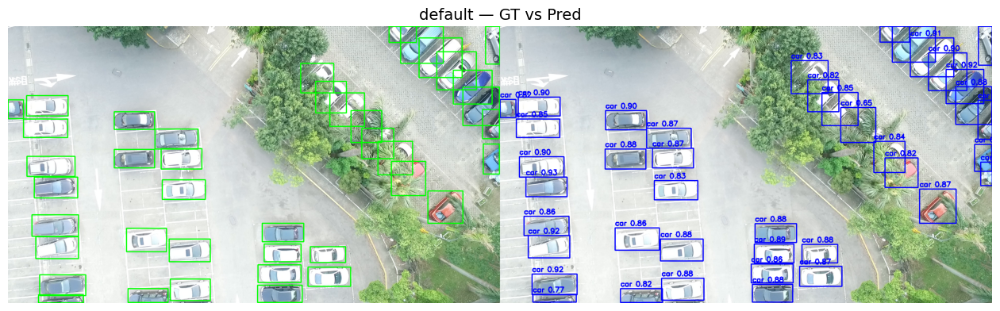


 high_iou


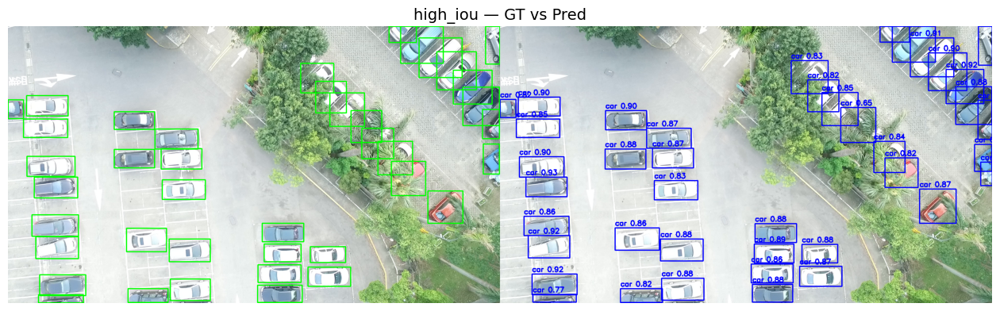


 low_iou


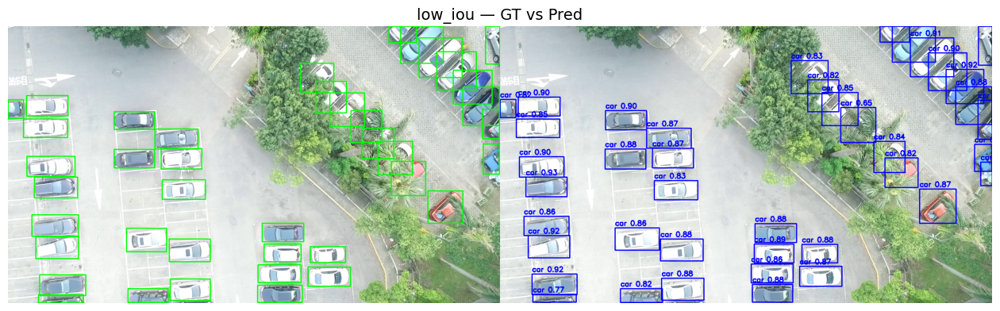


 high_box


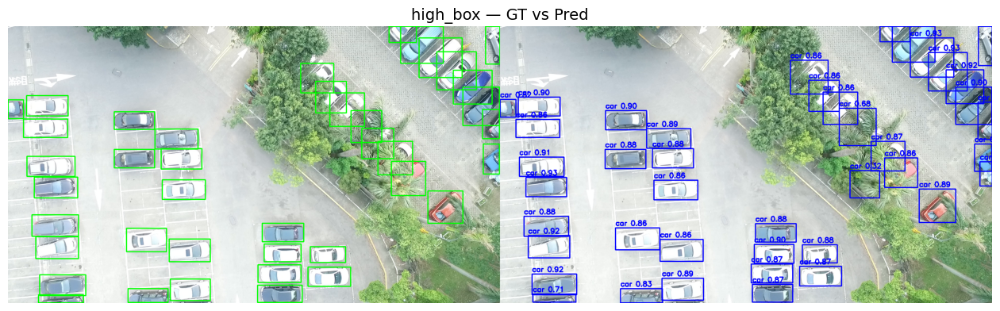


 high_dfl


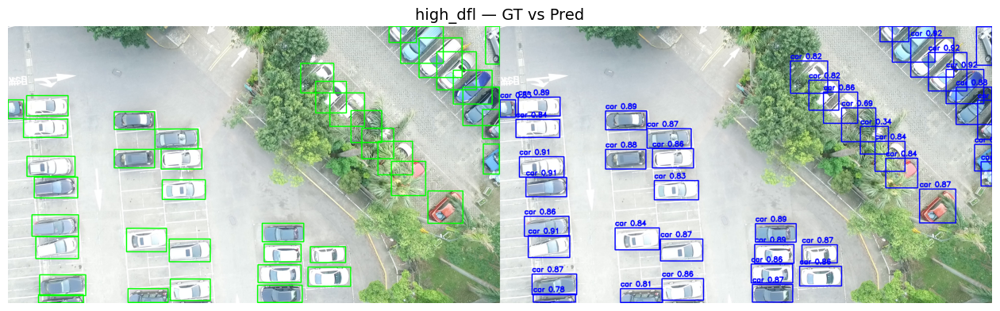

In [29]:
for exp in df_arch['experiment']:
    print(f"\n {exp}")
    model  = YOLO(f"runs/arch_hp/{exp}/weights/best.pt")
    orig   = cv2.imread(str(img_path))
    gt_img = orig.copy()
    pd_img = orig.copy()
    h,w    = orig.shape[:2]

    # GT in green
    for row in (label_dir/f"{img_path.stem}.txt").read_text().splitlines():
        cls,x_c,y_c,bw,bh = map(float, row.split())
        x1,y1 = int((x_c-bw/2)*w), int((y_c-bh/2)*h)
        x2,y2 = int((x_c+bw/2)*w), int((y_c+bh/2)*h)
        cv2.rectangle(gt_img, (x1,y1),(x2,y2),(0,255,0),2)

    # preds in blue
    res         = model.predict(source=str(img_path), conf=0.25, verbose=False)[0]
    pred_boxes  = res.boxes.xyxy.cpu().numpy()
    conf_scores = res.boxes.conf.cpu().numpy()
    for (x1,y1,x2,y2),c in zip(pred_boxes, conf_scores):
        x1,y1,x2,y2 = map(int,(x1,y1,x2,y2))
        cv2.rectangle(pd_img,(x1,y1),(x2,y2),(255,0,0),2)
        cv2.putText(pd_img, f"car {c:.2f}", (x1,y1-6),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255,0,0), 2)

    # side‐by‐side
    gt_rgb = cv2.cvtColor(gt_img, cv2.COLOR_BGR2RGB)
    pd_rgb = cv2.cvtColor(pd_img, cv2.COLOR_BGR2RGB)
    concat = np.hstack((gt_rgb, pd_rgb))
    plt.figure(figsize=(16,10))
    plt.imshow(concat); plt.axis('off')
    plt.title(f"{exp} — GT vs Pred", fontsize=14)
    plt.show()

To complement the quantitative results, side-by-side comparisons of ground-truth annotations and predicted bounding boxes are provided for each YOLOv8 architectural configuration. All models were evaluated on the same test image, and the predicted bounding boxes are displayed along with confidence scores.

From the visuals, the **default model** demonstrates excellent consistency, detecting nearly all vehicles accurately with high confidence. The `high_iou` and `low_iou` models produce almost identical results, confirming that the change in IoU threshold does not significantly alter model behavior for this dataset. This matches the identical precision, recall, and exact match accuracy observed in the quantitative results.

The `high_box` model introduces occasional false positives (as seen in the lower right area of the prediction), and the confidence scores fluctuate more compared to the default configuration. The `high_dfl` model shows tight bounding boxes and generally high confidence, reflecting its lower MSE value, though some minor localization offsets can be observed in dense or occluded regions.

Overall, these visual results align with the numerical findings and support the conclusion that **YOLOv8’s default architecture provides the most stable and balanced performance**. Adjustments to internal parameters such as box loss or DFL can lead to improvements in specific metrics but may also introduce side effects such as overfitting or reduced stability. Therefore, such modifications should be applied selectively and validated on task-specific criteria.


# Alternative Methods for Object Counting

While object detection–based approaches like YOLOv8 provide highly interpretable results by localizing and classifying each object instance, several other methods can also be used for object counting tasks, especially in dense or occluded environments:

1. **Density Map Estimation (Regression-Based Counting):**  
   Instead of detecting individual objects, models learn to generate a continuous density map where each pixel represents the likelihood of object presence. The final count is obtained by integrating the density map. This method is particularly effective in highly crowded scenes. Notable examples include **MCNN (Multi-column CNN)** and **CSRNet**.

2. **Image-Level Regression:**  
   A simpler approach involves training a CNN to directly regress the object count from the entire image without explicitly locating objects. Although fast, this method lacks localization ability and may struggle with varying object scales.

3. **Segmentation-Based Counting:**  
   Instance segmentation models like **Mask R-CNN** or semantic segmentation networks can be used to segment individual object instances. The number of distinct masks (or connected components) can then be counted.

4. **Transformer-Based Models:**  
   Recent models like **DETR (DEtection TRansformer)** and its variants provide an end-to-end object detection mechanism that can also be adapted for counting by analyzing the number of confident predictions.

5. **Crowd Counting Networks (for dense scenes):**  
   Specialized architectures, such as **Bayesian Loss for Crowd Counting** or **SFCN**, are designed for ultra-dense crowds and can be adapted to similar aerial tasks where objects (e.g., cars) are tightly packed.

---

Each of these methods comes with trade-offs. Detection-based methods like YOLO offer instance-level interpretability, while density-based approaches are more robust in occluded and overlapping scenarios. Method selection should be guided by the scene complexity, object density, and application requirements.
